In [1]:
library(xpose4)
library(xpose)
library(ggplot2)
library(gridExtra)
library(grid)
library(cowplot)
library(dplyr)
library(tidyverse)
library(svglite)
library(patchwork)
library(dr4pl)
library("RColorBrewer")

Loading required package: lattice

Loading required package: ggplot2


Attaching package: ‘xpose’


The following object is masked from ‘package:stats’:

    filter


Warning message:
“package ‘dplyr’ was built under R version 4.2.3”

Attaching package: ‘dplyr’


The following object is masked from ‘package:gridExtra’:

    combine


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


── Attaching core tidyverse packages ────────────────────────────────────── tidyverse 2.0.0 ──
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ lubridate 1.9.2     ✔ tibble    3.2.1
✔ purrr     1.0.1     ✔ tidyr     1.3.0
✔ readr     2.1.4     
── Conflicts ──────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::combine()   masks gridExtra::combine()
✖ dplyr::filter()    masks xpose::filter(), stats::filter()
✖ dplyr::lag()       masks stats::lag()
✖ lubridate:

In [2]:
log10_minor_break = function (...){
  function(x) {
    minx         = floor(min(log10(x), na.rm=T))-1;
    maxx         = ceiling(max(log10(x), na.rm=T))+1;
    n_major      = maxx-minx+1;
    major_breaks = seq(minx, maxx, by=1)
    minor_breaks = 
      rep(log10(seq(1, 9, by=1)), times = n_major)+
      rep(major_breaks, each = 9)
    return(10^(minor_breaks))
  }
}

In [3]:
options(scipen=999)

# Raw data

In [4]:
data_dir="./data/parsed/"

In [5]:
#need 7 colors
COLOR_MAP=c('#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3', '#a6d854', '#ffd92f', '#e5c494')
names(COLOR_MAP) <- c(1,2,3,13,14,25,28)

## BDQ

In [6]:
nm_dataset <- read.csv(paste(data_dir,"/","BDQ_dose_norm.csv",sep =""))

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


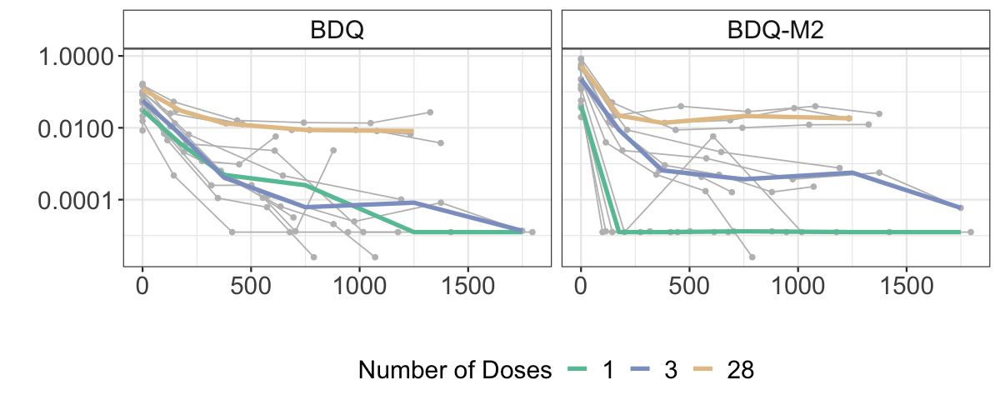

In [7]:
nm_dataset$METABname[nm_dataset$METAB==0] <- "BDQ"
nm_dataset$METABname[nm_dataset$METAB==1] <- "BDQ-M2"
nm_dataset$NDOSE[nm_dataset$DOSE==400] <- 3
nm_dataset$NDOSE[nm_dataset$DOSE==25] <- 1
nm_dataset$NDOSE[nm_dataset$DOSE==20] <- 28

COLOR_MAP_bdq <- COLOR_MAP[names(COLOR_MAP) %in% nm_dataset$NDOSE]

options(repr.plot.width = 10, repr.plot.height = 4)
p3 <- ggplot(subset(nm_dataset, DIST_CASEUM_UM!=-99 & EVID==0),mapping = aes(x = DIST_CASEUM_UM, y = dose_normalized_dv,group=factor(DOSE),color = factor(NDOSE)))+
  geom_point(color="grey")+
  geom_line(subset(nm_dataset, DIST_CASEUM_UM!=-99 & EVID==0),mapping = aes(x = DIST_CASEUM_UM, y = dose_normalized_dv,group=interaction(LESION)), color ="grey")+ # factor(DOSE)))+
  scale_y_log10()+
  stat_summary_bin(geom="line", fun="median", breaks=c(-100,100,250,500,1000,1500,2000), size=1.5)+
  xlab("")+
  ylab("")+
  facet_wrap(~METABname,nrow=1)+
  scale_color_manual(values = COLOR_MAP_bdq,name="Number of Doses")+
  theme_bw(base_size=14)+
  theme(legend.direction = "horizontal",
        legend.position = "bottom",
        strip.background =element_rect(fill="transparent"),
        strip.text = element_text(size=18),
              axis.text = element_text(size=18),
        axis.title = element_text(size=18),
       legend.text = element_text(size=18),
       legend.title = element_text(size=18))

p3

Warning message:
“Removed 37 rows containing non-finite values (`stat_summary_bin()`).”
Warning message:
“Removed 37 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_line()`).”


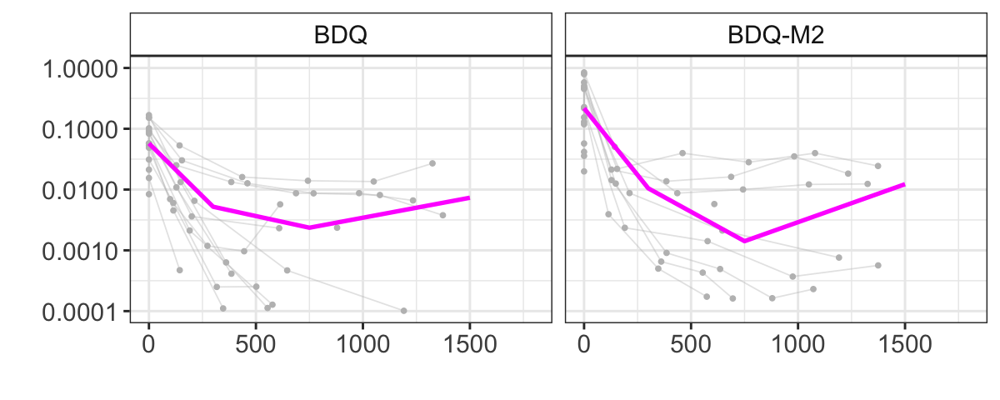

In [9]:
options(repr.plot.width = 10, repr.plot.height = 4)
p4 <- ggplot(subset(nm_dataset, DIST_CASEUM_UM!=-99 & EVID==0),mapping = aes(x = DIST_CASEUM_UM, y = dose_normalized_dv))+#DOSE_TIME))+
  geom_point(color="grey")+
  geom_line(subset(nm_dataset, DIST_CASEUM_UM!=-99 & EVID==0),mapping = aes(x = DIST_CASEUM_UM, y = dose_normalized_dv,group=LESION),color="grey",alpha=0.4)+
  scale_y_log10(limits = c(1e-4,1))+
  xlab("")+
  stat_summary_bin(geom="line", fun="median", breaks=c(-100,100,500,1000,2000), size=1.5,color='magenta')+
  ylab("")+
  facet_wrap(~METABname,nrow=1)+
  theme_bw(base_size=18)+
  theme(legend.direction = "horizontal",
        legend.position = "bottom",
        strip.background =element_rect(fill="transparent"),
        strip.text = element_text(size=18),
                     axis.text = element_text(size=18),
        axis.title = element_text(size=18))
p4

## TBAJ587

In [10]:
df <- read.csv(paste(data_dir,"/","TBA587_dose_norm.csv",sep =""))

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 2 rows containing non-finite values (`stat_summary_bin()`).”


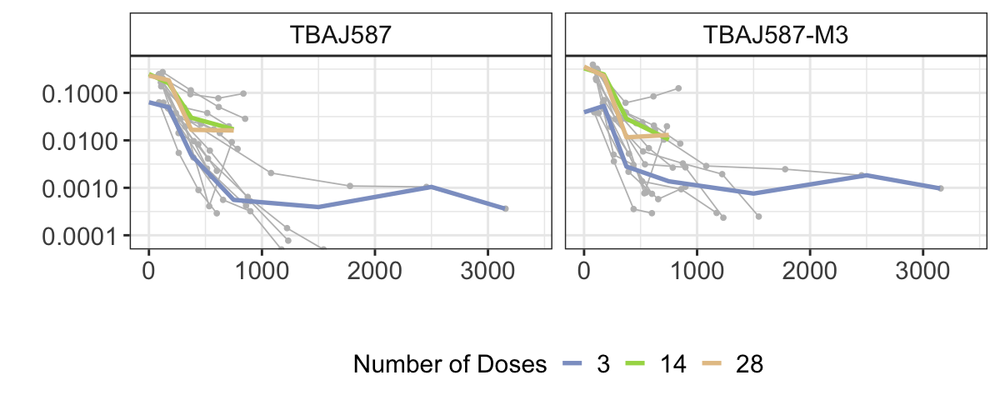

In [12]:
df$METABname[df$METAB==0] <- "TBAJ587" 
df$METABname[df$METAB==1] <- "TBAJ587-M3" 
df$DOSE_TIME <- paste(df$DOSEFLAT, "mg", df$TIMEH, "hours")

df$nDOSES_toplot <- df$nDOSES
df$nDOSES_toplot[df$nDOSES<=3] <- 3

COLOR_MAP_tbaj <- COLOR_MAP[names(COLOR_MAP) %in% df$nDOSES_toplot]

options(repr.plot.width = 10, repr.plot.height = 4)
p5 <- ggplot(subset(df, DIST2EDGE.UM!=-99),mapping = aes(x = DIST2EDGE.UM, y = dose_normalized_dv,group=factor(nDOSES_toplot),color=factor(nDOSES_toplot)))+#DOSE_TIME))+
  geom_point(color="grey")+
  geom_line(subset(df, DIST2EDGE.UM!=-99),mapping = aes(x = DIST2EDGE.UM, y = dose_normalized_dv,group=interaction(CID,BIOPSY)),color="grey")+
  
  xlab("")+
  stat_summary_bin(geom="line", fun="median", breaks=c(-100,100,250,500,1000,2000,3000,3300), size=1.5)+
  ylab("")+
  facet_wrap(~METABname,nrow=1)+
  xlim(0,3400)+
  ylim(-0.01,0.4)+
  scale_y_log10()+
  scale_color_manual(values = COLOR_MAP_tbaj,name="Number of Doses")+
  theme_bw(base_size=18)+
  theme(legend.direction = "horizontal",
        legend.position = "bottom",
        strip.background =element_rect(fill="transparent"),
        strip.text = element_text(size=18),
                     axis.text = element_text(size=18),
        axis.title = element_text(size=18),
       legend.text = element_text(size=18),
       legend.title = element_text(size=18))
p5

#grid.arrange(p,p1,nrow=1)

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 3 rows containing non-finite values (`stat_summary_bin()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1 row containing missing values (`geom_line()`).”


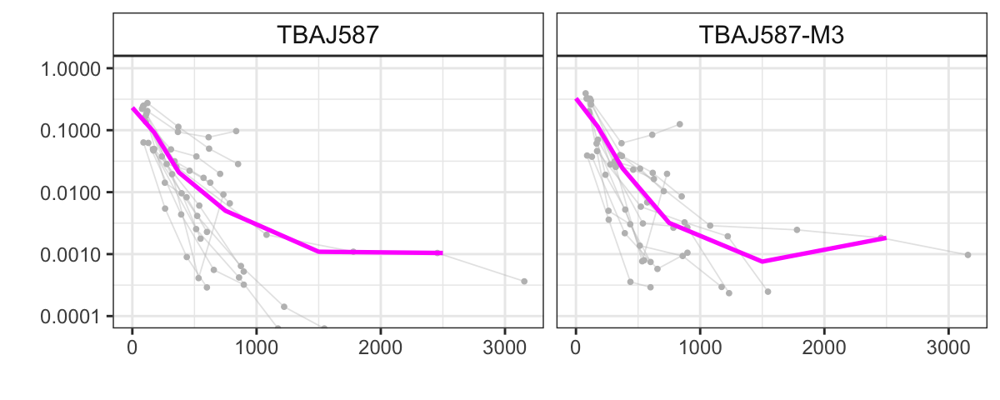

In [13]:
options(repr.plot.width = 10, repr.plot.height = 4)
p6 <- ggplot(subset(df, DIST2EDGE.UM!=-99 & EVID==0),mapping = aes(x = DIST2EDGE.UM, y = dose_normalized_dv))+#DOSE_TIME))+
  geom_point(color="grey")+
  geom_line(subset(df, DIST2EDGE.UM!=-99 & EVID==0),mapping = aes(x = DIST2EDGE.UM, y = dose_normalized_dv,group=interaction(CID,BIOPSY)),color="grey",alpha=0.4)+
  scale_y_log10(limits = c(1e-4,1))+
  xlab("")+
  stat_summary_bin(geom="line", fun="median", breaks=c(-100,100,250,500,1000,2000,3000), size=1.5,color='magenta')+
  ylab("")+
  facet_wrap(~METABname,nrow=1)+
  theme_bw(base_size=18)+
  theme(legend.direction = "horizontal",
        legend.position = "bottom",
        strip.background =element_rect(fill="transparent"),
        strip.text = element_text(size=18))
p6

## TBAJ876

In [14]:
df876 <- read.csv(paste(data_dir,"/","TBAJ876_distance_plot_correct_ndoses.csv",sep =""))

In [15]:
df876$METABname[df876$CMPD==1] <- "TBAJ876" 
df876$METABname[df876$CMPD==2] <- "TBAJ876-M3" 

df876$nDOSES_toplot <- df876$NDOSES

COLOR_MAP_tbaj <- COLOR_MAP[names(COLOR_MAP) %in% df876$nDOSES_toplot]

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 19 rows containing non-finite values (`stat_summary_bin()`).”


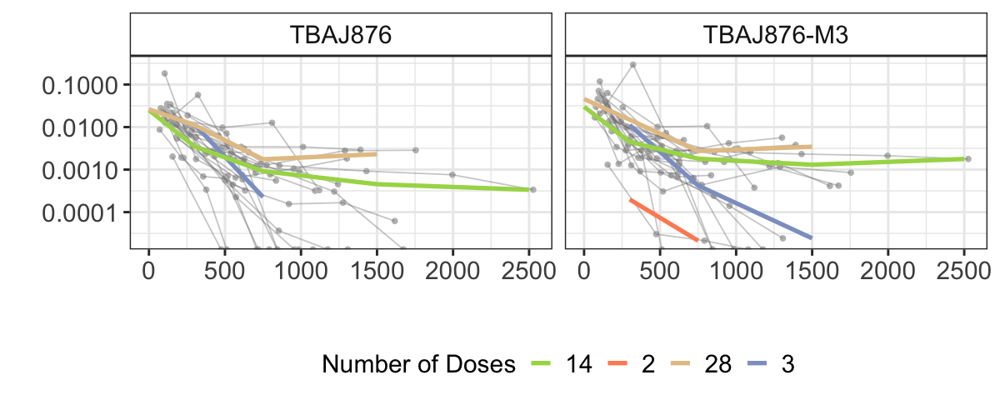

In [16]:
options(repr.plot.width = 10, repr.plot.height = 4)
p1 <- ggplot(subset(df876, DIST.UM!=-99),mapping = aes(x = DIST.UM, y = dose_normalized_dv,group=factor(nDOSES_toplot),color=factor(nDOSES_toplot)))+#DOSE_TIME))+
  geom_point(color="grey")+
  geom_line(subset(df876, DIST.UM!=-99),mapping = aes(x = DIST.UM, y = dose_normalized_dv,group=ID_BIOPSY_factor,color="grey"),alpha=0.4)+
  scale_y_log10()+
  xlab("")+
  stat_summary_bin(geom="line", fun="median", breaks=c(-100,100,500,1000,2000,3000), size=1.5)+
  ylab("")+
  facet_wrap(~METABname,nrow=1)+
  scale_color_manual(values = COLOR_MAP_tbaj,name="Number of Doses")+
  theme_bw(base_size=18)+
  theme(legend.direction = "horizontal",
        legend.position = "bottom",
        strip.background =element_rect(fill="transparent"),
        strip.text = element_text(size=18),
       axis.text = element_text(size=18),
        axis.title = element_text(size=18),
       legend.text = element_text(size=18),
       legend.title = element_text(size=18))
p1

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 24 rows containing non-finite values (`stat_summary_bin()`).”
Warning message:
“Removed 5 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1 row containing missing values (`geom_line()`).”


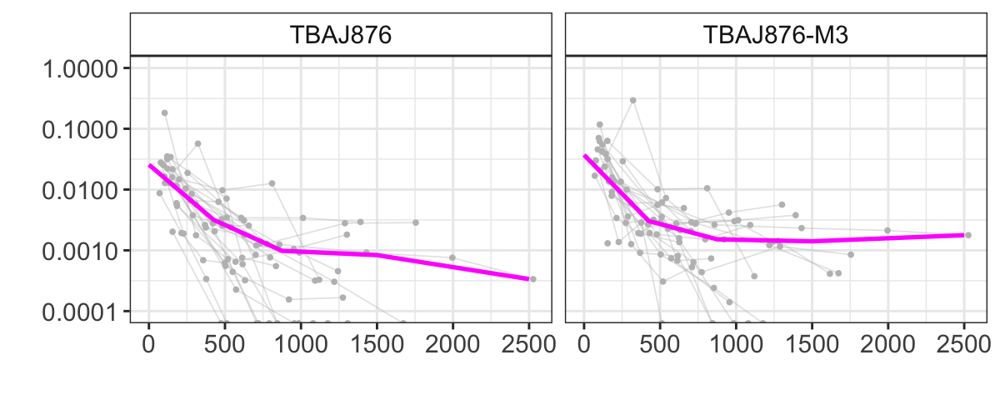

In [17]:
options(repr.plot.width = 10, repr.plot.height = 4)
p2 <- ggplot(subset(df876, DIST.UM!=-99),mapping = aes(x = DIST.UM, y = dose_normalized_dv))+#DOSE_TIME))+
  geom_point(color="grey")+
  geom_line(subset(df876, DIST.UM!=-99),mapping = aes(x = DIST.UM, y = dose_normalized_dv,group=ID_BIOPSY_factor),color="grey",alpha=0.4)+
  scale_y_log10(limits = c(1e-4,1))+
  xlab("")+
  stat_summary_bin(geom="line", fun="median", breaks=c(-100,100,750,1000,2000,3000), size=1.5,color='magenta')+
  ylab("")+
  facet_wrap(~METABname,nrow=1)+
  theme_bw(base_size=18)+
  theme(legend.direction = "horizontal",
        legend.position = "bottom",
        strip.background =element_rect(fill="transparent"),
        strip.text = element_text(size=18),
              axis.text = element_text(size=18),
        axis.title = element_text(size=18),
       legend.text = element_text(size=18),
       legend.title = element_text(size=18))
p2

## RAW DATA PLOT WITH ALL DARQS

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 2 rows containing non-finite values (`stat_summary_bin()`).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 19 rows containing non-finite values (`stat_summary_bin()`).”


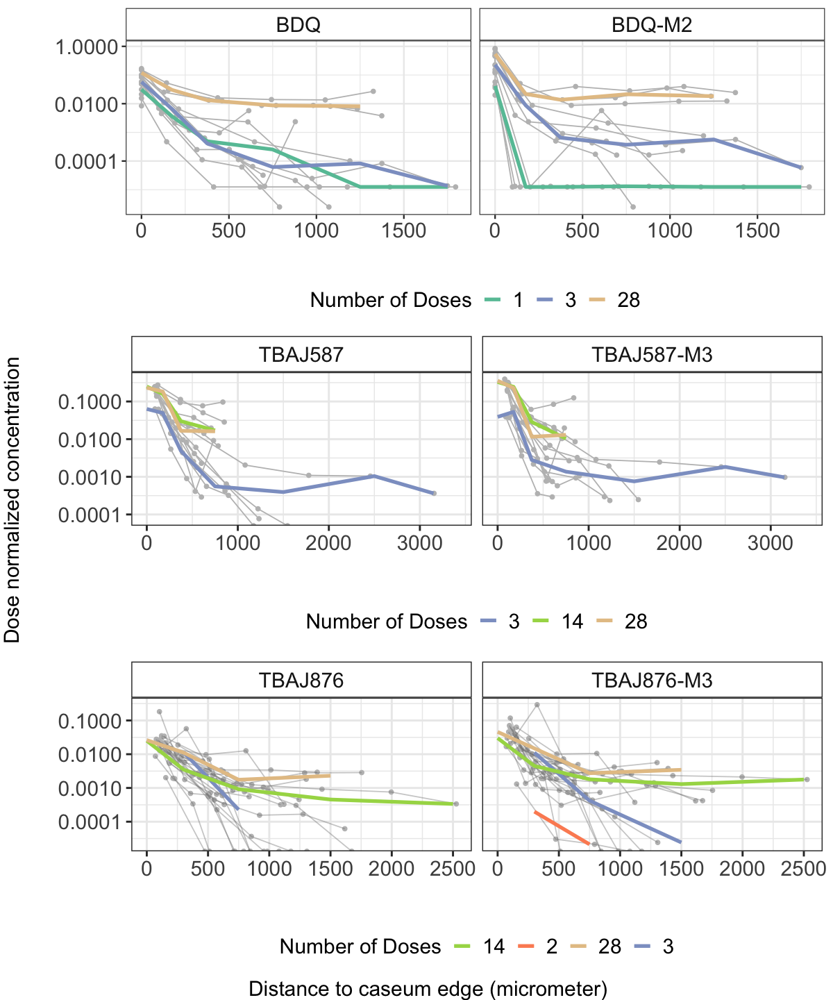

In [18]:
options(repr.plot.width = 10, repr.plot.height = 12)
full=grid.arrange(p3,p5,p1,nrow=3,
                  bottom=textGrob('Distance to caseum edge (micrometer)',gp=gpar(fontsize=18)),
                 left=textGrob("Dose normalized concentration", gp=gpar(fontsize=18),rot = 90))

Warning message:
“Removed 37 rows containing non-finite values (`stat_summary_bin()`).”
Warning message:
“Removed 37 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_line()`).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 3 rows containing non-finite values (`stat_summary_bin()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1 row containing missing values (`geom_line()`).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Remo

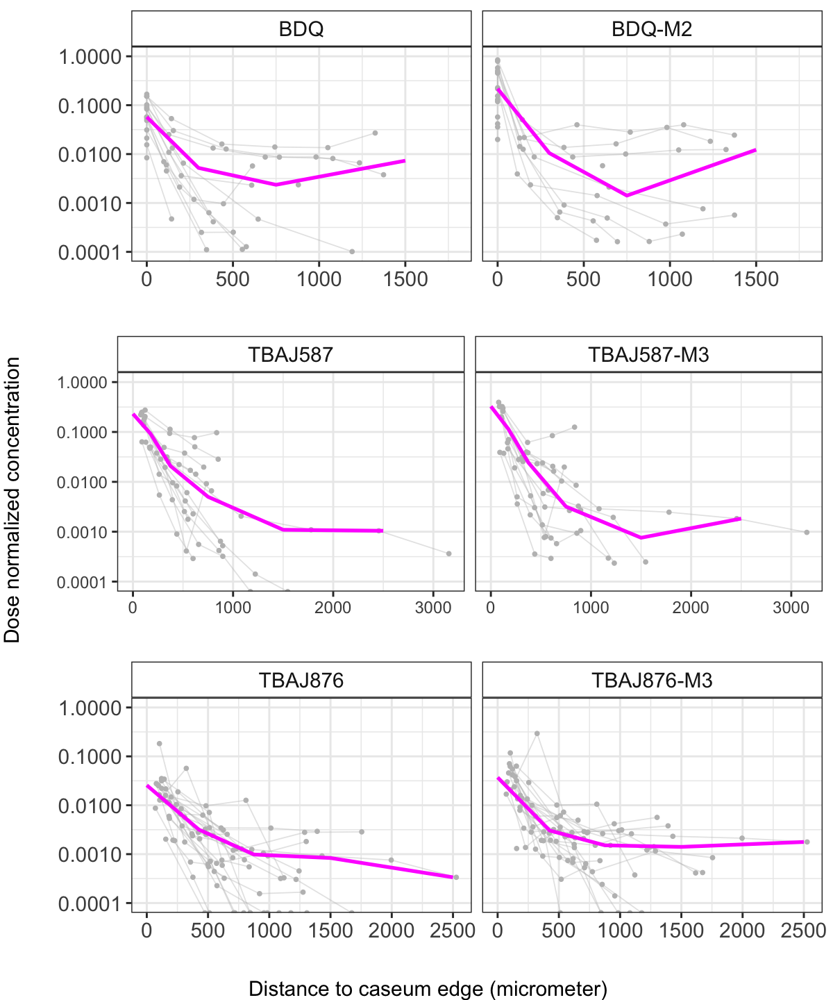

In [19]:
options(repr.plot.width = 10, repr.plot.height = 12)
full=grid.arrange(p4,p6,p2,nrow=3,
                  #left = "Dose normalized concentration",
                  bottom=textGrob('Distance to caseum edge (micrometer)',gp=gpar(fontsize=18)),
                 left=textGrob("Dose normalized concentration", gp=gpar(fontsize=18),rot = 90))

## Nonrabbit animals

In [20]:
all_animals_df <- read.csv(paste(data_dir,"/","all_animals_BDQ.csv",sep =""))

In [21]:
#need 4 colors
COLOR_MAP=c('#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3', '#a6d854', '#ffd92f')
names(COLOR_MAP) <- c('1 dose(s) at 25mg/kg', '17 dose(s) at 25mg/kg',
       '26 dose(s) at 20mg/kg', '28 dose(s) at 20mg/kg',
       '36 dose(s) at 20mg/kg', '31 dose(s) at 8mg/kg')

COLOR_MAP_tbaj <- COLOR_MAP[names(COLOR_MAP) %in% all_animals_df$Dose.information]

In [22]:
all_animals_df$SPECIES[all_animals_df$SPECIES == 'marmoset']<-'NHP'

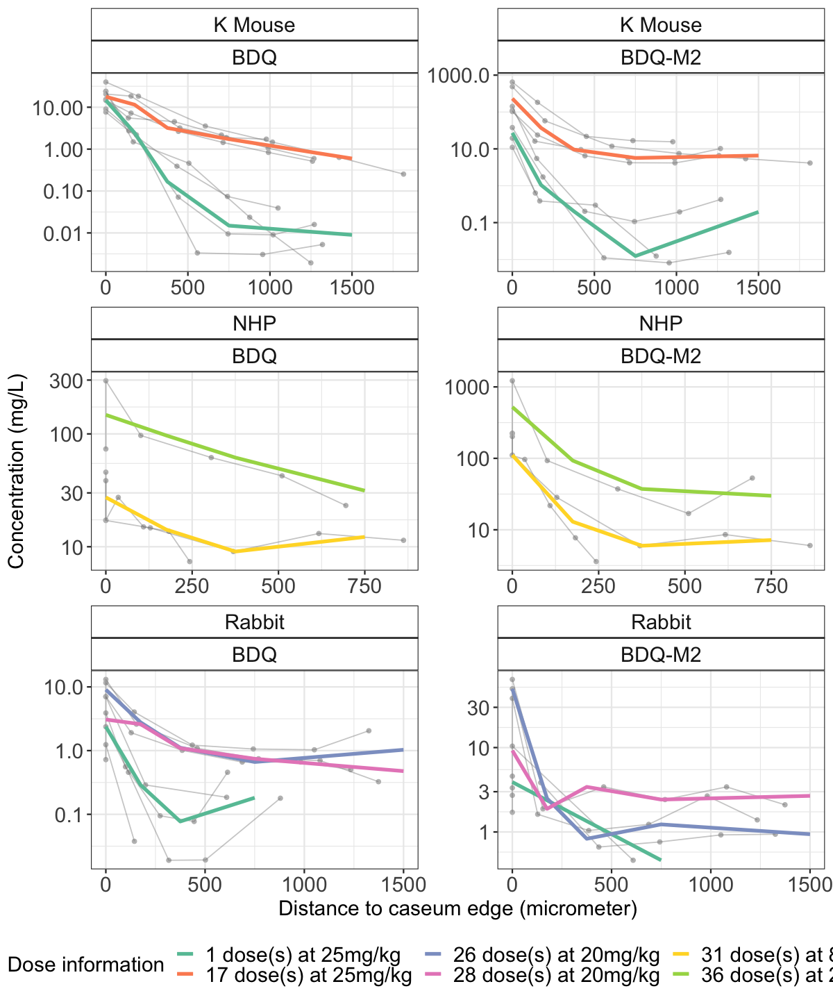

In [23]:
all_animals <- ggplot(subset(all_animals_df, DV!='.'),mapping = aes(x = DIST_CASEUM_UM, y = as.numeric(DV),group=factor(Dose.information),color=factor(Dose.information)))+#DOSE_TIME))+
  geom_point(color="grey")+
  geom_line(subset(all_animals_df, DV!='.'),mapping = aes(x = DIST_CASEUM_UM, y = as.numeric(DV),group=LESION,color="grey"),alpha=0.4)+
  scale_y_log10()+
  xlab("Distance to caseum edge (micrometer)")+
  stat_summary_bin(geom="line", fun="median", breaks=c(-100,100,250,500,1000,2000,3000), size=1.5)+
  ylab("Concentration (mg/L)")+
  facet_wrap(SPECIES~CMPD,nrow=4, scales='free')+
  scale_color_manual(values = COLOR_MAP_tbaj,name="Dose information")+
  theme_bw(base_size=14)+
  theme(legend.direction = "horizontal",
        legend.position = "bottom",
        strip.background =element_rect(fill="transparent"),
        strip.text = element_text(size=18),
               axis.text = element_text(size=18),
        axis.title = element_text(size=18),
        legend.text = element_text(size=18),
        legend.title = element_text(size=18))
all_animals

# Rabbit models

## Lesion GOFs

In [24]:
rabbit_dir="./final_mods/rabbit/"

### BDQ

In [25]:
run <- "D01"
drug <- 'BDQ'

In [26]:
parent <- read_nm_table(paste(rabbit_dir,"/",drug,"/sdtab", run, sep ="")) %>% 
  filter(METABFL == 0) %>%
  mutate(METABFL= 'BDQ')%>%
  select(METABFL, ID, RABBITID, PRED, IPRED, DV, IWRES, CWRES, DIST, TIME)

met <- read_nm_table(paste(rabbit_dir,"/",drug,"/sdtab", run, sep ="")) %>% 
  filter(METABFL == 1) %>%
  mutate(METABFL= 'BDQ-M2')%>%
  select(METABFL, ID, RABBITID, PRED, IPRED, DV, IWRES, CWRES, DIST, TIME)

all_biopsy <- rbind(parent, met) %>% 
  group_by(METABFL,ID) %>% 
  summarise(PRED = mean(PRED), 
            IPRED = mean(IPRED), 
            sdDV = sd(DV), 
            DV = mean(DV))

all_rabbit <- rbind(parent, met) %>% 
  group_by(METABFL,RABBITID) %>% 
  summarise(PRED = mean(PRED), 
            IPRED = mean(IPRED), 
            sdDV = sd(DV), 
            DV = mean(DV))

all1 <- rbind(parent, met)

`summarise()` has grouped output by 'METABFL'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'METABFL'. You can override using the `.groups` argument.


In [27]:
color_list_bdq <- c('#66C2A5', '#58A18C')

colfunc <- colorRampPalette(c('#66C2A5', '#58A18C'))
colfunc(3)

[1] "#66C2A5" "#5FB198" "#58A18C"

In [28]:
p1 <- ggplot(all_biopsy, mapping = aes(x = IPRED, y = DV, color = METABFL))+
  geom_point(size=3,alpha=0.8)+
  geom_abline(intercept=0,slope=1)+
  geom_errorbar(aes(ymin=DV-sdDV, ymax=DV+sdDV),size=1)+
  theme_bw()+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
  xlab("Predicted (log mg/L)")+
  ylab("Observed (log mg/L)")+
 scale_color_manual(values = color_list_bdq) +
      theme(legend.background = element_rect("transparent"),
          strip.background = element_rect("transparent"),
          legend.text = element_text(size=18),
          legend.justification = c(0, 1),
          legend.position = c(0.05, 0.98),
          legend.direction = "vertical",
          legend.key.height = unit(0.005,'in'),
          legend.title = element_blank(),
          panel.grid.minor = element_blank(),
          panel.grid = element_blank(),
          axis.text = element_text(size = 18),
          strip.text = element_text(size =18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.title = element_text(size = 18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.margin = unit(c(0.5,0.2,0.1,0.1), "cm"))

In [29]:
p2 <- ggplot(all1[all1$PRED!=0,], mapping = aes( x = TIME, y = CWRES, color = METABFL))+
  geom_point(size=3,alpha=0.8)+
geom_smooth(se=F,span=1)+
geom_hline(yintercept=0)+
  theme_bw()+
  xlab("Time (hours)")+
  ylab("Conditional\nweighted residuals")+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
 scale_color_manual(values = color_list_bdq) +
      theme(legend.background = element_rect("transparent"),
          strip.background = element_rect("transparent"),
          legend.text = element_text(size=18),
          legend.justification = c(0, 1),
          legend.position = "None",
          legend.direction = "vertical",
          legend.key.height = unit(0.05,'in'),
          legend.title = element_blank(),
          panel.grid.minor = element_blank(),
          panel.grid = element_blank(),
          axis.text = element_text(size = 18),
          strip.text = element_text(size =18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.title = element_text(size = 18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.margin = unit(c(0.5,0.2,0.1,0.1), "cm"))

In [30]:
p3 <- ggplot(all1[all1$PRED!=0,], mapping = aes( x = DIST, y = CWRES, color = METABFL))+
  geom_point(size=3,alpha=0.8)+
geom_smooth(se=F,span=1)+
geom_hline(yintercept=0)+
coord_cartesian(xlim = c(0, 3100))+
  theme_bw()+
  xlab("Distance (um)")+
  ylab("Conditional\nweighted residuals")+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
 scale_color_manual(values = color_list_bdq) +
      theme(legend.background = element_rect("transparent"),
          strip.background = element_rect("transparent"),
          legend.text = element_text(size=18),
          legend.justification = c(0, 1),
          legend.position = "None",
          legend.direction = "vertical",
          legend.key.height = unit(0.05,'in'),
          legend.title = element_blank(),
          panel.grid.minor = element_blank(),
          panel.grid = element_blank(),
          axis.text = element_text(size = 18),
          strip.text = element_text(size =18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.title = element_text(size = 18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.margin = unit(c(0.5,0.2,0.1,0.1), "cm"))

In [31]:
options(repr.plot.width = 5, repr.plot.height = 15)

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


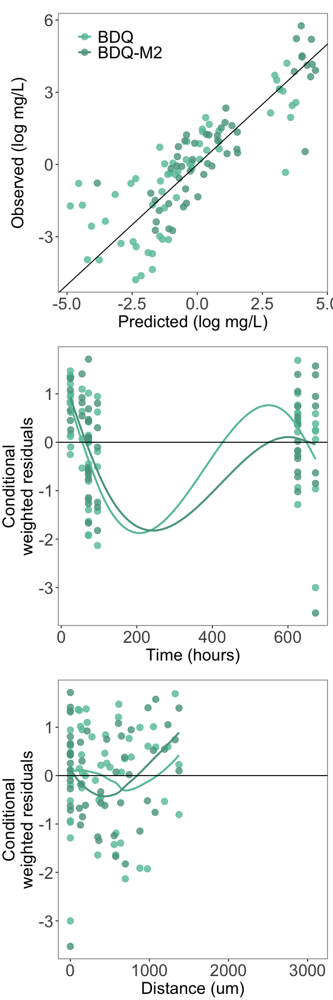

In [32]:
plot_grid(p1, p2, p3, nrow = 3,align="hv")

### TBAJ587

In [33]:
run <- "D01"
drug <- "TBAJ587"

In [34]:
parent <- read_nm_table(paste(rabbit_dir,"/",drug,"/sdtab", run, sep ="")) %>% 
  filter(METAB == 0) %>%
  mutate(METAB= 'TBAJ-587')%>%
  select(METAB, ID, RABBITID, PRED, IPRED, DV, IWRES, CWRES, DIST, TIME)

met <- read_nm_table(paste(rabbit_dir,"/",drug,"/sdtab", run, sep ="")) %>% 
  filter(METAB == 1) %>%
  mutate(METAB= 'TBAJ-587-M3')%>%
  select(METAB, ID, RABBITID, PRED, IPRED, DV, IWRES, CWRES, DIST, TIME)

all_rabbit <- rbind(parent, met) %>% 
  group_by(METAB,RABBITID) %>% 
  summarise(PRED = mean(PRED), 
            IPRED = mean(IPRED), 
            sdDV = sd(DV), 
            DV = mean(DV))

all_biopsy <- rbind(parent, met) %>% 
  group_by(METAB,ID) %>% 
  summarise(PRED = mean(PRED), 
            IPRED = mean(IPRED), 
            sdDV = sd(DV), 
            DV = mean(DV))

all1 <- rbind(parent,met)

`summarise()` has grouped output by 'METAB'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'METAB'. You can override using the `.groups` argument.


In [35]:
color_list_587 <- c('#FC8D62', '#B7694B')

In [36]:
p4 <- ggplot(all_biopsy, mapping = aes(x = IPRED, y = DV, color = METAB))+
  geom_point(size=3,alpha=0.8)+
  geom_abline(intercept=0,slope=1)+
  geom_errorbar(aes(ymin=DV-sdDV, ymax=DV+sdDV),size=1)+
  theme_bw()+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
  xlab("Predicted (log mg/L)")+
  ylab("Observed (log mg/L)")+
 scale_color_manual(values = color_list_587) +
      theme(legend.background = element_rect("transparent"),
          strip.background = element_rect("transparent"),
          legend.text = element_text(size=18),
          legend.justification = c(0, 1),
          legend.position = c(0.05, 0.98),
          legend.direction = "vertical",
          legend.key.height = unit(0.005,'in'),
          legend.title = element_blank(),
          panel.grid.minor = element_blank(),
          panel.grid = element_blank(),
          axis.text = element_text(size = 18),
          strip.text = element_text(size =18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.title = element_text(size = 18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.margin = unit(c(0.5,0.2,0.1,0.1), "cm"))

In [37]:
p5 <- ggplot(all1[all1$PRED!=0,], mapping = aes( x = TIME, y = CWRES, color = METAB))+
  geom_point(size=3,alpha=0.8)+
geom_smooth(se=F,span=1)+
geom_hline(yintercept=0)+
  theme_bw()+
  xlab("Time (hours)")+
  ylab("Conditional\nweighted residuals")+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
 scale_color_manual(values = color_list_587) +
      theme(legend.background = element_rect("transparent"),
          strip.background = element_rect("transparent"),
          legend.text = element_text(size=18),
          legend.justification = c(0, 1),
          legend.position = "None",
          legend.direction = "vertical",
          legend.key.height = unit(0.05,'in'),
          legend.title = element_blank(),
          panel.grid.minor = element_blank(),
          panel.grid = element_blank(),
          axis.text = element_text(size = 18),
          strip.text = element_text(size =18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.title = element_text(size = 18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.margin = unit(c(0.5,0.2,0.1,0.1), "cm"))

In [38]:
p6 <- ggplot(all1[all1$PRED!=0,], mapping = aes( x = DIST, y = CWRES, color = METAB))+
  geom_point(size=3,alpha=0.8)+
geom_smooth(se=F,span=1)+
geom_hline(yintercept=0)+
coord_cartesian(xlim = c(0, 3100))+
  theme_bw()+
  xlab("Distance (um)")+
  ylab("Conditional\nweighted residuals")+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
 scale_color_manual(values = color_list_587) +
      theme(legend.background = element_rect("transparent"),
          strip.background = element_rect("transparent"),
          legend.text = element_text(size=18),
          legend.justification = c(0, 1),
          legend.position = "None",
          legend.direction = "vertical",
          legend.key.height = unit(0.05,'in'),
          legend.title = element_blank(),
          panel.grid.minor = element_blank(),
          panel.grid = element_blank(),
          axis.text = element_text(size = 18),
          strip.text = element_text(size =18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.title = element_text(size = 18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.margin = unit(c(0.5,0.2,0.1,0.1), "cm"))

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


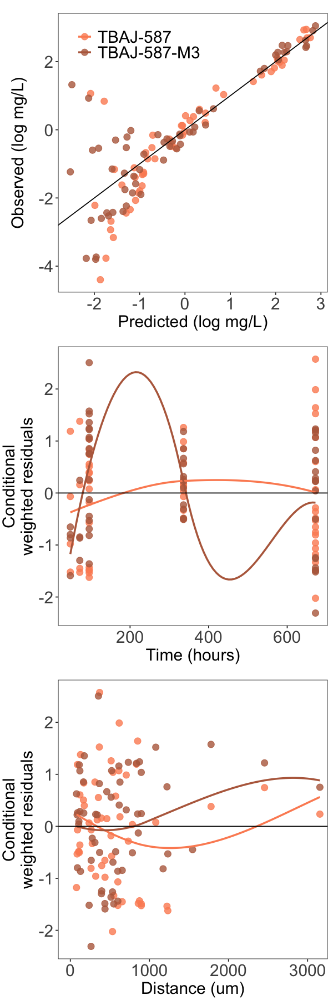

In [39]:
plot_grid(p4, p5, p6, ncol = 1,align="hv")

### TBAJ876

In [40]:
drug <- "TBAJ876"

In [41]:
parent <- read_nm_table(paste(rabbit_dir,"/",drug,"/sdtab", 
                              "D86", #parent
                              sep ="")) %>% 
  filter(CMPD == 1) %>%
  mutate(CMPD= 'TBAJ-876')%>%
  select(CMPD, ID, iCL, PRED, IPRED, DV, IWRES, CWRES, DIST, TIME)


met <- read_nm_table(paste(rabbit_dir,"/",drug,"/sdtab", 
                           "D87", #metabolite
                           sep ="")) %>% 
  filter(CMPD == 2) %>%
  mutate(CMPD= 'TBAJ-876-M3')%>%
  select(CMPD, ID, iCL, PRED, IPRED, DV, IWRES, CWRES, DIST, TIME)

all_biopsy <- rbind(parent, met) %>% 
  group_by(CMPD,ID) %>% 
  summarise(PRED = mean(PRED), 
            IPRED = mean(IPRED), 
            sdDV = sd(DV), 
            DV = mean(DV))

all_rabbit <- rbind(parent, met) %>% 
  group_by(CMPD,iCL) %>% 
  summarise(PRED = mean(PRED), 
            IPRED = mean(IPRED), 
            sdDV = sd(DV), 
            DV = mean(DV))

all1 <- rbind(parent,met)

`summarise()` has grouped output by 'CMPD'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'CMPD'. You can override using the `.groups` argument.


In [42]:
color_list_876 <- c('#FFD92F', '#9C841C')

In [43]:
p7 <- ggplot(all_biopsy, mapping = aes(x = IPRED, y = DV, color = CMPD))+
  geom_point(size=3,alpha=0.8)+
  geom_abline(intercept=0,slope=1)+
  theme_bw()+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
  xlab("Predicted (log mg/L)")+
  ylab("Observed (log mg/L)")+
 scale_color_manual(values = color_list_876) +
      theme(legend.background = element_rect("transparent"),
          strip.background = element_rect("transparent"),
          legend.text = element_text(size=18),
          legend.justification = c(0, 1),
          legend.position = c(0.05, 0.98),
          legend.direction = "vertical",
          legend.key.height = unit(0.005,'in'),
          legend.title = element_blank(),
          panel.grid.minor = element_blank(),
          panel.grid = element_blank(),
          axis.text = element_text(size = 18),
          strip.text = element_text(size =18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.title = element_text(size = 18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.margin = unit(c(0.5,0.2,0.1,0.1), "cm"))

In [44]:
p8 <- ggplot(all1[all1$PRED!=0,], mapping = aes( x = TIME, y = CWRES, color = CMPD))+
  geom_point(size=3,alpha=0.8)+
geom_smooth(se=F,span=1)+
geom_hline(yintercept=0)+
  theme_bw()+
  xlab("Time (hours)")+
  ylab("Conditional\nweighted residuals")+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
 scale_color_manual(values = color_list_876) +
      theme(legend.background = element_rect("transparent"),
          strip.background = element_rect("transparent"),
          legend.text = element_text(size=18),
          legend.justification = c(0, 1),
          legend.position = "None",
          legend.direction = "vertical",
          legend.key.height = unit(0.05,'in'),
          legend.title = element_blank(),
          panel.grid.minor = element_blank(),
          panel.grid = element_blank(),
          axis.text = element_text(size = 18),
          strip.text = element_text(size =18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.title = element_text(size = 18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.margin = unit(c(0.5,0.2,0.1,0.1), "cm"))

In [45]:
p9 <- ggplot(all1[all1$PRED!=0,], mapping = aes( x = DIST, y = CWRES, color = CMPD))+
  geom_point(size=3,alpha=0.8)+
geom_smooth(se=F,span=1)+
geom_hline(yintercept=0)+
coord_cartesian(xlim = c(0, 3100))+
  theme_bw()+
  xlab("Distance (um)")+
  ylab("Conditional\nweighted residuals")+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
 scale_color_manual(values = color_list_876) +
      theme(legend.background = element_rect("transparent"),
          strip.background = element_rect("transparent"),
          legend.text = element_text(size=18),
          legend.justification = c(0, 1),
          legend.position = "None",
          legend.direction = "vertical",
          legend.key.height = unit(0.05,'in'),
          legend.title = element_blank(),
          panel.grid.minor = element_blank(),
          panel.grid = element_blank(),
          axis.text = element_text(size = 18),
          strip.text = element_text(size =18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.title = element_text(size = 18,
                                    margin = margin(0.1,0,0.05,0, "cm")),
          plot.margin = unit(c(0.5,0.2,0.1,0.1), "cm"))

In [46]:
options(repr.plot.width = 5, repr.plot.height = 15)

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


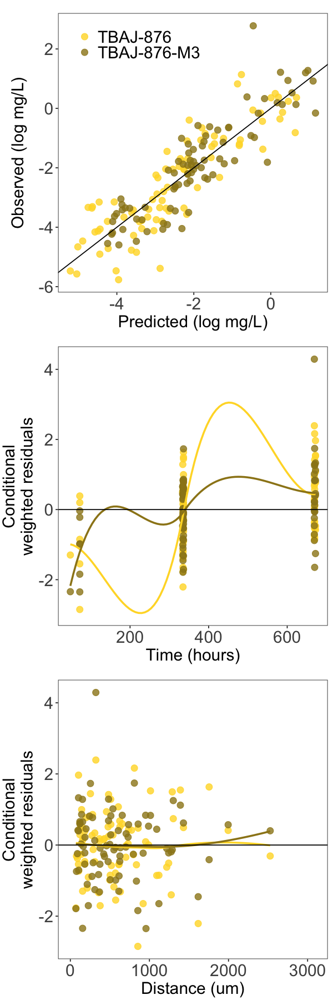

In [47]:
plot_grid(p7, p8,p9, ncol = 1,align="hv")

### ALL DARQS PLOT

In [48]:
options(repr.plot.width = 10, repr.plot.height = 10)
gof<-plot_grid(p1,p3,
               p4,p6,
               p7,p9, 
               nrow = 3,align="hv")

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


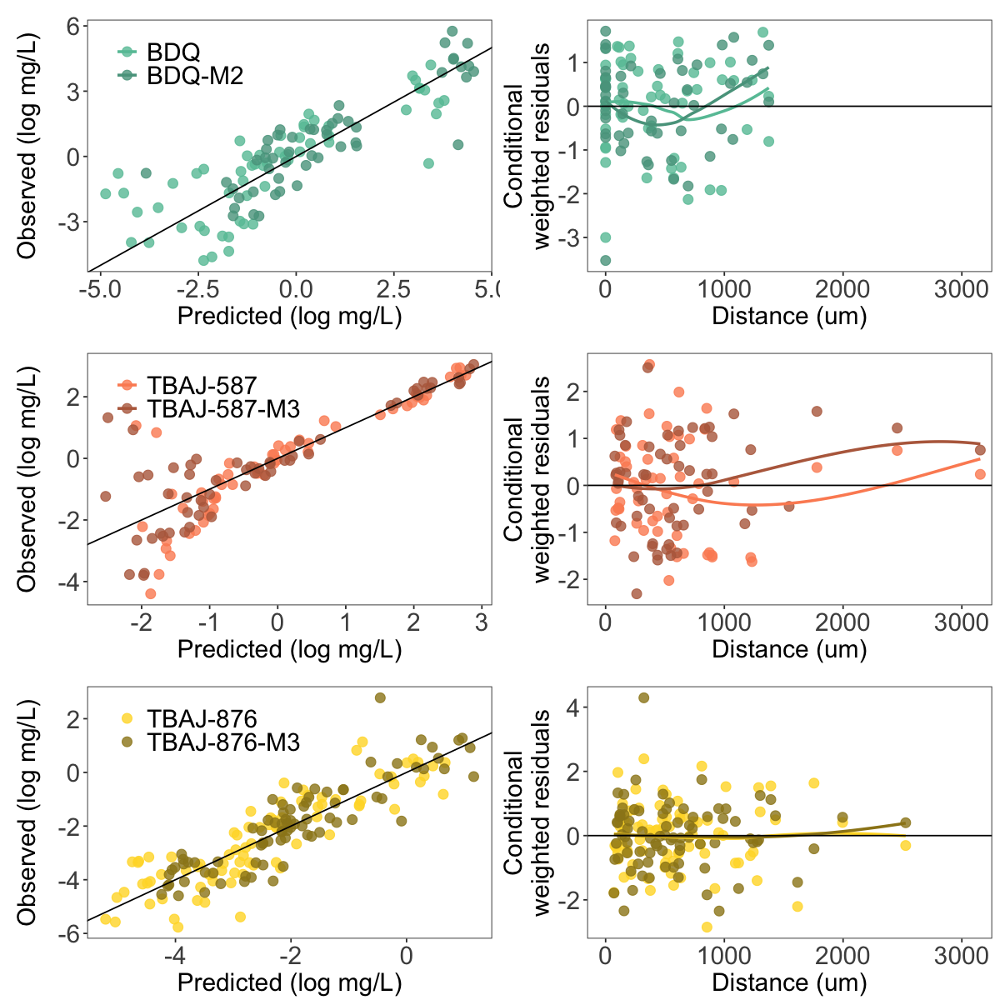

In [49]:
gof

## Plasma and lesion VPCs

### BDQ plasma

In [50]:
drug <- "BDQ"

In [51]:
runno <- "59"

options(repr.plot.width = 6, repr.plot.height = 4)
bdq_plasma <- vpc::vpc_vpc(psn_folder = paste(rabbit_dir,drug,'/run',runno,'vpc-nopred',sep=""),
                  obs_cols = list(idv = "TAD"),
                  sim_cols = list(idv = "TAD"),
                  lloq=-1, #to help with plotting
                  vpc_theme=(vpc::new_vpc_theme(update = list(
                                obs_color = "black",
                                sim_median_fill=color_list_bdq[1],
                      sim_pi_fill=color_list_bdq[2],
                                sim_median_alpha=0.5,
                                obs_size = 1))),
                  stratify = "METAB",
                  show = list(obs_dv =T))+
  facet_wrap(~METAB, scales = "free", labeller = labeller(METAB = c("0" = "BDQ",
                                                                    "1" = "BDQ-M2")))+
  theme_bw(base_size = 18)+
  theme(panel.grid = element_blank())+
  coord_cartesian(ylim = c(0,NA)) +
  scale_y_continuous(label=scales::scientific) +
  labs(x = "Time after dose (h)",
       y = "Plasma\nconcentration (mg/L)")


── Column specification ──────────────────────────────────────────────────────────────────────
cols(
  ID = col_double(),
  MDV = col_double(),
  METAB = col_double(),
  TAD = col_double(),
  DV = col_double()
)


── Column specification ──────────────────────────────────────────────────────────────────────
cols(
  ID = col_character(),
  MDV = col_character(),
  METAB = col_character(),
  TAD = col_character(),
  DV = col_character()
)

Warning message:
“999 parsing failures.
 row col  expected    actual                                                                     file
 526  -- 5 columns 3 columns './final_mods/rabbit/BDQ/run59vpc-nopred/m1/vpc_simulation.1.npctab.dta'
1053  -- 5 columns 3 columns './final_mods/rabbit/BDQ/run59vpc-nopred/m1/vpc_simulation.1.npctab.dta'
1580  -- 5 columns 3 columns './final_mods/rabbit/BDQ/run59vpc-nopred/m1/vpc_simulation.1.npctab.dta'
2107  -- 5 columns 3 columns './final_mods/rabbit/BDQ/run59vpc-nopred/m1/vpc_simulation.1.npctab.dta'
2634  -

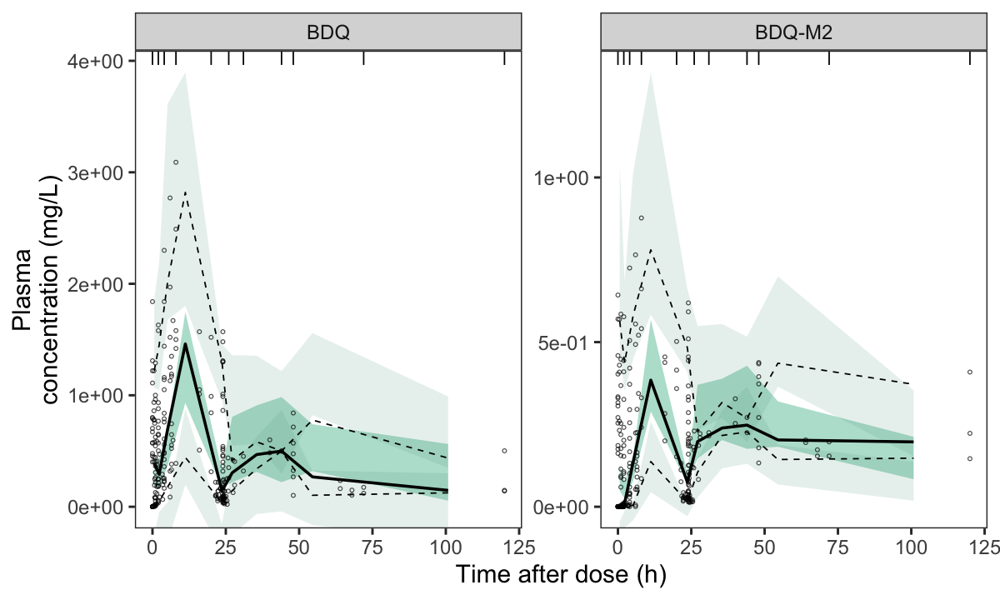

In [52]:
options(repr.plot.width = 10, repr.plot.height = 6)
bdq_plasma

### BDQ Lesion

In [53]:
run <- "D01"

In [54]:
sd <- vpc::read_table_nm(paste(rabbit_dir,drug,"/","sdtab", run, sep ="")) %>%
  filter(EVID == 0 )%>%
  mutate(DV= exp(DV))%>%
  filter(DIST <2000)

sdsim <- vpc::read_table_nm(paste(rabbit_dir,drug,"/","sdtab", paste(run, "_sim", sep =""), sep =""))%>%
  filter(EVID == 0) %>%
  mutate(DV= exp(DV))%>%
  filter(DIST <2000)

parent_sd = sd %>%
  filter(METABFL == 0) 

parent_sdsim = sdsim %>%
  filter(METABFL == 0) 

parent_sd_dist = sd %>%
  filter(METABFL == 0)  %>%
  mutate(TIME = DIST) 

parent_sdsim_dist = sdsim %>%
  filter(METABFL == 0)  %>%
  mutate(TIME = DIST) 

met_sd = sd %>%
  filter(METABFL == 1) 

met_sdsim = sdsim %>%
  filter(METABFL == 1) 

met_sd_dist = sd %>%
  filter(METABFL == 1)  %>%
  mutate(TIME = DIST) 

met_sdsim_dist = sdsim %>%
  filter(METABFL == 1)  %>%
  mutate(TIME = DIST)

Warning message:
“Duplicated column names deduplicated: 'DV' => 'DV_1' [22]”

── Column specification ──────────────────────────────────────────────────────────────────────
cols(
  .default = col_double()
)
ℹ Use `spec()` for the full column specifications.

Warning message:
“Duplicated column names deduplicated: 'DV' => 'DV_1' [22]”

── Column specification ──────────────────────────────────────────────────────────────────────
cols(
  .default = col_character()
)
ℹ Use `spec()` for the full column specifications.

Warning message:
“999 parsing failures.
row col   expected    actual                                   file
178  -- 25 columns 3 columns './final_mods/rabbit/BDQ/sdtabD01_sim'
357  -- 25 columns 3 columns './final_mods/rabbit/BDQ/sdtabD01_sim'
536  -- 25 columns 3 columns './final_mods/rabbit/BDQ/sdtabD01_sim'
715  -- 25 columns 3 columns './final_mods/rabbit/BDQ/sdtabD01_sim'
894  -- 25 columns 3 columns './final_mods/rabbit/BDQ/sdtabD01_sim'
... ... .......... ......... ..

In [55]:
parent_sdsim_dist$overall <- "BDQ"
parent_sd_dist$overall <- 'BDQ'

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


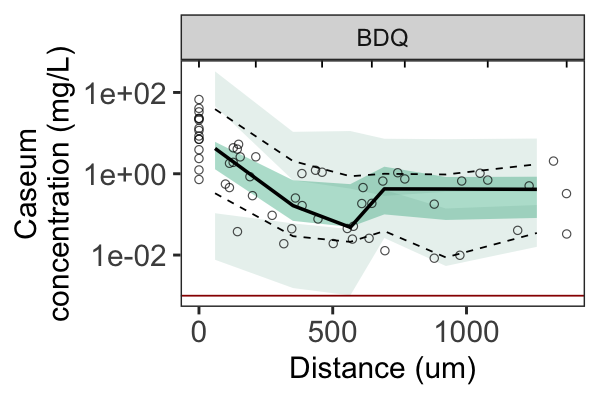

In [56]:
options(repr.plot.width = 5, repr.plot.height = 3.33)
bdq_p <- vpc::vpc(sim= parent_sdsim_dist, obs = parent_sd_dist, 
                  lloq = 0.001, 
                  show=list(obs_dv=T),
                  ylab = "Bedaquiline (ng/mL)", 
                  xlab = "Distance (um)", 
                  vpc_theme=(vpc::new_vpc_theme(update = list(
                                obs_color = "black",
                                sim_median_fill=color_list_bdq[1],
                                sim_pi_fill=color_list_bdq[2],
                                sim_median_alpha=0.5,
                                obs_size = 2))),
                  bins='jenks',log_y =T) +
  facet_wrap(~overall,ncol=1)+
  theme_bw(base_size=18)+
  scale_y_log10(label=scales::scientific)+
  theme(panel.grid = element_blank())+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
  labs(y = "Caseum\nconcentration (mg/L)")

bdq_p

In [57]:
met_sdsim_dist$overall <- "BDQ-M2"
met_sd_dist$overall <- 'BDQ-M2'

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


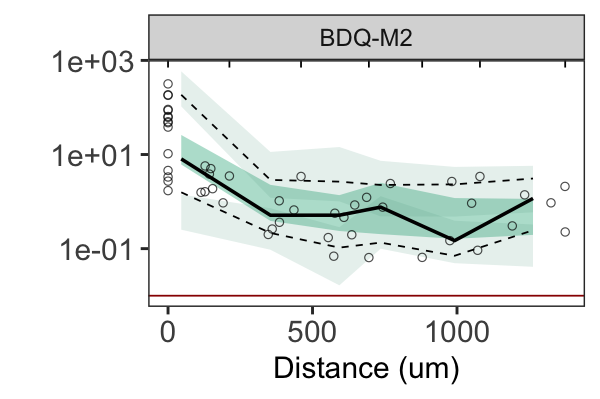

In [58]:
options(repr.plot.width = 5, repr.plot.height = 3.33)
bdq_m2_p <- vpc::vpc(sim= met_sdsim_dist, obs = met_sd_dist, 
                                lloq = 0.010, 
                     show=list(obs_dv=T),
                             ylab = "Bedaquiline-M2 (ng/mL)", 
                             xlab = "Distance (um)", 
                     vpc_theme=(vpc::new_vpc_theme(update = list(
                                obs_color = "black",
                                sim_median_fill=color_list_bdq[1],
                      sim_pi_fill=color_list_bdq[2],
                                sim_median_alpha=0.5,
                                obs_size = 2))),
                     bins='jenks',log_y =T) +
  theme_bw(base_size=18)+
facet_wrap(~overall,ncol=1)+
theme(panel.grid = element_blank())+
scale_y_log10(label=scales::scientific)+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
  labs(y = "")

bdq_m2_p

### TBAJ587 plasma

In [59]:
drug <- "TBAJ587"
runno <- "61"

options(repr.plot.width = 6, repr.plot.height = 4)
s587_plasma <- vpc::vpc_vpc(psn_folder = paste(rabbit_dir,drug,'/run',runno,'vpc-nopred',sep=""),
                  obs_cols = list(idv = "TAD"),
                  sim_cols = list(idv = "TAD"),
                  lloq=-1,
                  #logy=T,
                  vpc_theme=(vpc::new_vpc_theme(update = list(
                                obs_color = "black",
                                sim_median_fill=color_list_587[1],
                      sim_pi_fill=color_list_587[2],
                                sim_median_alpha=0.5,
                                obs_size = 1))),
                  stratify = "METAB",
                  show = list(obs_dv =T))+
  facet_wrap(~METAB, scales = "free", labeller = labeller(METAB = c("0" = "TBAJ587",
                                                                    "1" = "TBAJ587-M3")))+
  theme_bw(base_size = 18)+
  theme(panel.grid = element_blank())+
  #scale_y_log10(limits=c(0, NA))+
  coord_cartesian(ylim = c(0,NA)) +
  scale_y_continuous(label=scales::scientific) +
  labs(x = "Time after dose (h)",
       y = "Plasma\nconcentration (mg/L)")


── Column specification ──────────────────────────────────────────────────────────────────────
cols(
  ID = col_double(),
  MDV = col_double(),
  METAB = col_double(),
  TAD = col_double(),
  DV = col_double()
)


── Column specification ──────────────────────────────────────────────────────────────────────
cols(
  ID = col_character(),
  MDV = col_character(),
  METAB = col_character(),
  TAD = col_character(),
  DV = col_character()
)

Warning message:
“999 parsing failures.
 row col  expected    actual                                                                         file
 590  -- 5 columns 3 columns './final_mods/rabbit/TBAJ587/run61vpc-nopred/m1/vpc_simulation.1.npctab.dta'
1181  -- 5 columns 3 columns './final_mods/rabbit/TBAJ587/run61vpc-nopred/m1/vpc_simulation.1.npctab.dta'
1772  -- 5 columns 3 columns './final_mods/rabbit/TBAJ587/run61vpc-nopred/m1/vpc_simulation.1.npctab.dta'
2363  -- 5 columns 3 columns './final_mods/rabbit/TBAJ587/run61vpc-nopred/m1/vpc_simulation.1

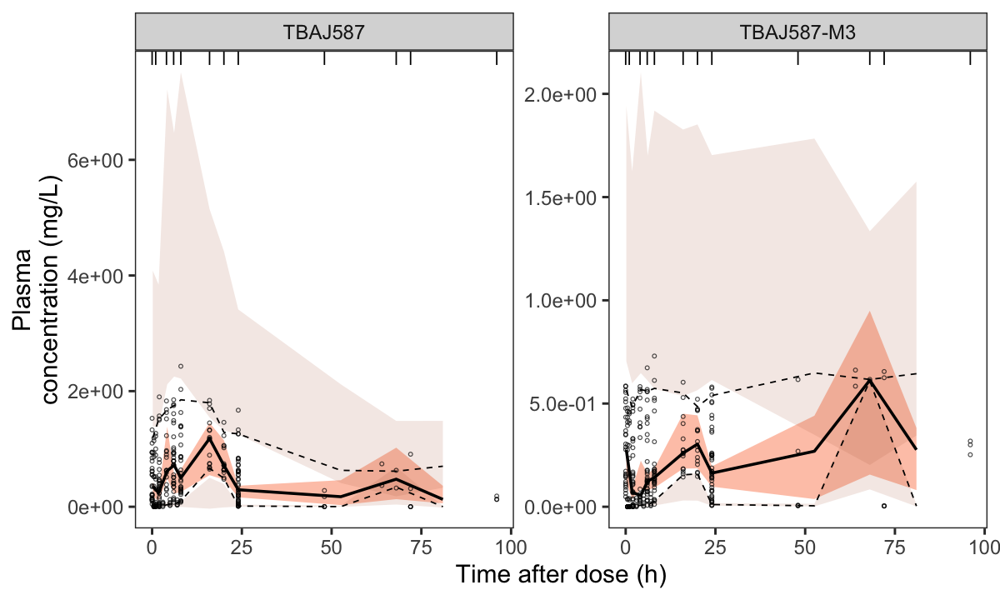

In [60]:
options(repr.plot.width = 10, repr.plot.height = 6)
s587_plasma

### TBAJ587 lesion

In [61]:
run <- "D01"

In [62]:
sd <- vpc::read_table_nm(paste(rabbit_dir,drug,'/',"sdtab", run, sep ="")) %>%
  filter(EVID == 0 )%>%
  mutate(DV= exp(DV)) %>% 
  filter(DIST <2000)

sdsim <- vpc::read_table_nm(paste(rabbit_dir,drug,'/',"sdtab", paste(run, "_sim", sep =""), sep =""))%>%
  filter(EVID == 0) %>%
  mutate(DV= exp(DV)) %>%
  filter(DIST <2000)

parent_sd = sd %>%
  filter(METAB == 0) 

parent_sdsim = sdsim %>%
  filter(METAB == 0)

parent_sd_dist = sd %>%
  filter(METAB == 0)  %>%
  mutate(TIME = DIST) 

parent_sdsim_dist = sdsim %>%
  filter(METAB == 0)  %>%
  mutate(TIME = DIST) 

met_sd = sd %>%
  filter(METAB == 1) 


met_sdsim = sdsim %>%
  filter(METAB == 1)

met_sd_dist = sd %>%
  filter(METAB == 1)  %>%
  mutate(TIME = DIST) 

met_sdsim_dist = sdsim %>%
  filter(METAB == 1)  %>%
  mutate(TIME = DIST) 

Warning message:
“Duplicated column names deduplicated: 'DV' => 'DV_1' [27]”

── Column specification ──────────────────────────────────────────────────────────────────────
cols(
  .default = col_double()
)
ℹ Use `spec()` for the full column specifications.

Warning message:
“Duplicated column names deduplicated: 'DV' => 'DV_1' [27]”

── Column specification ──────────────────────────────────────────────────────────────────────
cols(
  .default = col_character()
)
ℹ Use `spec()` for the full column specifications.

Warning message:
“999 parsing failures.
row col   expected    actual                                       file
173  -- 30 columns 3 columns './final_mods/rabbit/TBAJ587/sdtabD01_sim'
347  -- 30 columns 3 columns './final_mods/rabbit/TBAJ587/sdtabD01_sim'
521  -- 30 columns 3 columns './final_mods/rabbit/TBAJ587/sdtabD01_sim'
695  -- 30 columns 3 columns './final_mods/rabbit/TBAJ587/sdtabD01_sim'
869  -- 30 columns 3 columns './final_mods/rabbit/TBAJ587/sdtabD01_sim'
... ...

In [63]:
parent_sdsim_dist$overall <- "TBAJ587"
parent_sd_dist$overall <- 'TBAJ587'

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


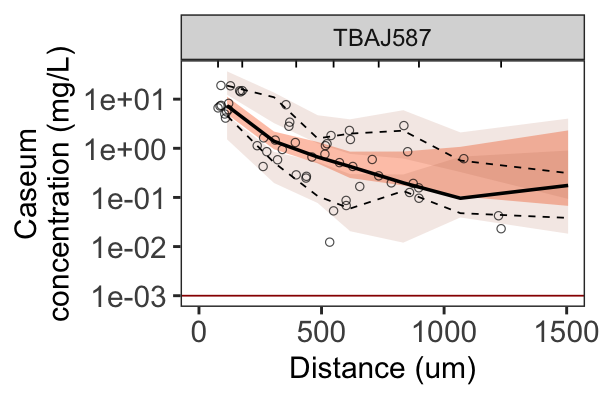

In [64]:
options(repr.plot.width = 5, repr.plot.height = 3.33)
tbaj587_p <- vpc::vpc(sim= parent_sdsim_dist, obs = parent_sd_dist, 
                               lloq = 0.001, 
                      show=list(obs_dv=T),
                               ylab = "TBAJ-587 (mg/L)", 
                               xlab = "Distance (um)", 
                      bins='jenks',
                      vpc_theme=(vpc::new_vpc_theme(update = list(
                                obs_color = "black",
                                sim_median_fill=color_list_587[1],
                      sim_pi_fill=color_list_587[2],
                                sim_median_alpha=0.5,
                                obs_size = 2))),
                               log_y =T) +
  theme_bw(base_size=18)+
  facet_wrap(~overall,ncol=1)+
  coord_cartesian(xlim = c(0, 1500)) +
  scale_y_log10(label=scales::scientific)+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
  theme(panel.grid = element_blank())+
  labs(y = "Caseum\nconcentration (mg/L)")

tbaj587_p

In [65]:
met_sdsim_dist$overall <- "TBAJ587-M3"
met_sd_dist$overall <- 'TBAJ587-M3'

Coordinate system already present. Adding new coordinate system, which will replace the
existing one.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


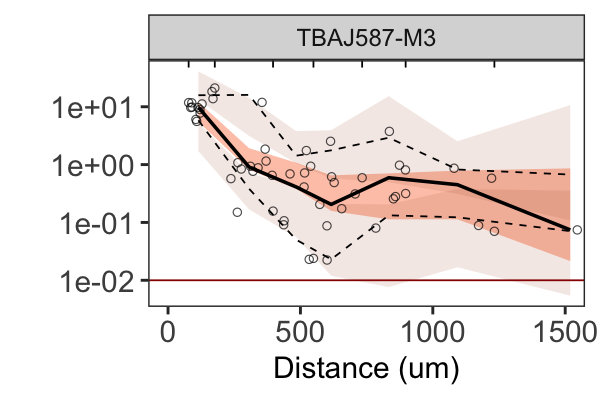

In [66]:
options(repr.plot.width = 5, repr.plot.height = 3.33)
tbaj587_m3_p <- vpc::vpc(sim= met_sdsim_dist, obs = met_sd_dist, 
                             lloq = 0.010, 
                         show=list(obs_dv=T),
                             ylab = "TBAJ-587-M3 (ng/mL)", 
                             xlab = "Distance (um)", 
                        vpc_theme=(vpc::new_vpc_theme(update = list(
                                obs_color = "black",
                                sim_median_fill=color_list_587[1],
                      sim_pi_fill=color_list_587[2],
                                sim_median_alpha=0.5,
                                obs_size = 2))),
                         bins='jenks',
                             log_y =T) +
  facet_wrap(~overall,ncol=1)+
  coord_cartesian(ylim = c(1, 100000)) +
  theme_bw(base_size=18)+
  coord_cartesian(xlim = c(0, 1500)) +

  scale_y_log10(labels = scales::scientific)+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18)) +
  theme(panel.grid = element_blank())  +
  labs(y = "")

tbaj587_m3_p

### TBAJ876 plasma

In [67]:
drug <- "TBAJ876"
runno <- "134"

options(repr.plot.width = 6, repr.plot.height = 4)
s876_plasma <- vpc::vpc_vpc(psn_folder = paste(rabbit_dir,drug,'/run',runno,'vpc-nopred',sep=''),
                  obs_cols = list(idv = "TAD"),
                  sim_cols = list(idv = "TAD"),
                  lloq=-1, #to help with plotting
                  vpc_theme=(vpc::new_vpc_theme(update = list(
                                obs_color = "black",
                                sim_median_fill=color_list_876[1],
                      sim_pi_fill=color_list_876[2],
                                sim_median_alpha=0.5,
                                obs_size = 1))),
                  stratify = "CMPD",
                  show = list(obs_dv =T))+
  facet_wrap(~CMPD, scales = "free", labeller = labeller(CMPD = c("1" = "TBAJ876",
                                                                    "2" = "TBAJ876-M3")))+
  theme_bw(base_size = 18)+
  theme(panel.grid = element_blank())+
  coord_cartesian(ylim = c(0,NA)) +
  scale_y_continuous(label=scales::scientific) +
  labs(x = "Time after dose (h)",
       y = "Plasma\nconcentration (mg/L)")



── Column specification ──────────────────────────────────────────────────────────────────────
cols(
  ID = col_double(),
  MDV = col_double(),
  CMPD = col_double(),
  TAD = col_double(),
  DV = col_double()
)


── Column specification ──────────────────────────────────────────────────────────────────────
cols(
  ID = col_character(),
  MDV = col_character(),
  CMPD = col_character(),
  TAD = col_character(),
  DV = col_character()
)

Warning message:
“999 parsing failures.
 row col  expected    actual                                                                          file
 782  -- 5 columns 3 columns './final_mods/rabbit/TBAJ876/run134vpc-nopred/m1/vpc_simulation.1.npctab.dta'
1565  -- 5 columns 3 columns './final_mods/rabbit/TBAJ876/run134vpc-nopred/m1/vpc_simulation.1.npctab.dta'
2348  -- 5 columns 3 columns './final_mods/rabbit/TBAJ876/run134vpc-nopred/m1/vpc_simulation.1.npctab.dta'
3131  -- 5 columns 3 columns './final_mods/rabbit/TBAJ876/run134vpc-nopred/m1/vpc_simulatio

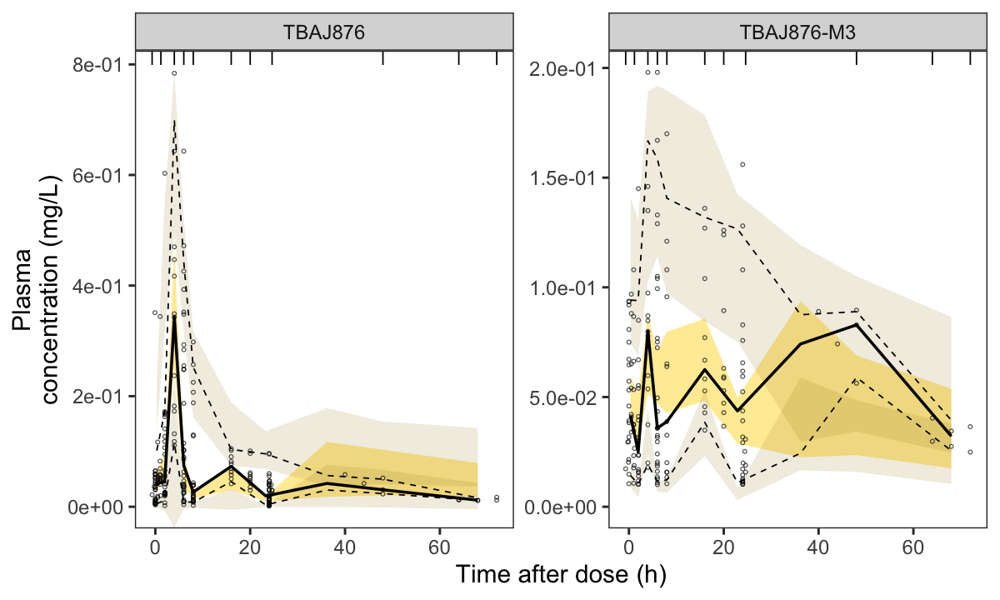

In [68]:
options(repr.plot.width = 10, repr.plot.height = 6)
s876_plasma

### TBAJ876 lesion

In [69]:
run_p <- "D86" #parent
run_m <- "D87" #metabolite

In [71]:
sd <- vpc::read_table_nm(paste(rabbit_dir,drug,"/sdtab", run_p, sep ="")) %>%
  filter(EVID == 0 )%>%
  mutate(DV= (exp(DV)))%>% 
  filter(DIST <2000)

sdsim <- vpc::read_table_nm(paste(rabbit_dir,drug,"/sdtab", paste(run_p, "_sim", sep =""), sep =""))%>%
  filter(EVID == 0) %>%
  mutate(DV= (exp(DV)))%>% 
  filter(DIST <2000)

parent_sd = sd %>%
  filter(CMPD == 1) 

parent_sdsim = sdsim %>%
  filter(CMPD == 1) 

parent_sd_dist = sd %>%
  filter(CMPD == 1)  %>%
  mutate(TIME = DIST)

parent_sdsim_dist = sdsim %>%
  filter(CMPD == 1)  %>%
  mutate(TIME = DIST) 


Warning message:
“Duplicated column names deduplicated: 'DV' => 'DV_1' [21]”

── Column specification ──────────────────────────────────────────────────────────────────────
cols(
  .default = col_double()
)
ℹ Use `spec()` for the full column specifications.

Warning message:
“Duplicated column names deduplicated: 'DV' => 'DV_1' [21]”

── Column specification ──────────────────────────────────────────────────────────────────────
cols(
  .default = col_double()
)
ℹ Use `spec()` for the full column specifications.

Warning message:
“13473 parsing failures.
 row  col   expected    actual                                       file
1684 ID   a double   TABLE     './final_mods/rabbit/TBAJ876/sdtabD86_sim'
1684 TIME a double   NO.       './final_mods/rabbit/TBAJ876/sdtabD86_sim'
1684 NA   24 columns 3 columns './final_mods/rabbit/TBAJ876/sdtabD86_sim'
1685 ID   a double   ID        './final_mods/rabbit/TBAJ876/sdtabD86_sim'
1685 TIME a double   TIME      './final_mods/rabbit/TBAJ876/sdtabD86_s

In [72]:
parent_sdsim_dist$overall <- "TBAJ876"
parent_sd_dist$overall <- 'TBAJ876'

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


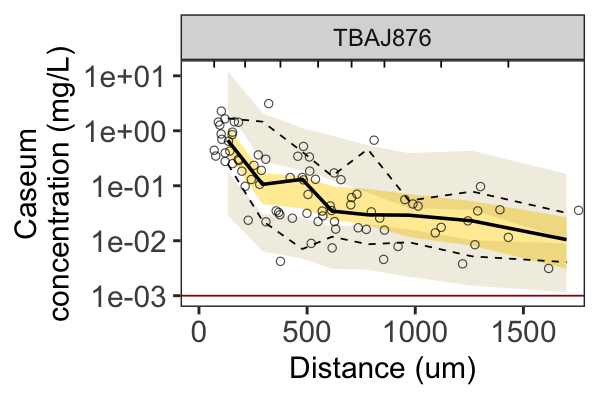

In [73]:
options(repr.plot.width = 5, repr.plot.height = 3.33)
tbaj876_p <- vpc::vpc(sim= parent_sdsim_dist, obs = parent_sd_dist, 
                                        lloq = 0.001, 
                                        show=list(obs_dv=T),
                                        vpc_theme=(vpc::new_vpc_theme(update = list(
                                obs_color = "black",
                                sim_median_fill=color_list_876[1],
                      sim_pi_fill=color_list_876[2],
                                sim_median_alpha=0.5,
                                obs_size = 2))),
                                ylab = "Caseum\nconcentration (mg/L)", 
                                xlab = "Distance (um)", 
                                bins='jenks',
                                log_y =T) +
  theme_bw(base_size=18)+
  coord_cartesian(xlim = c(0, 1700)) +
  scale_y_log10(label=scales::scientific) +
  facet_wrap(~overall,ncol=1)+
  theme(panel.grid = element_blank())+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18))

tbaj876_p

In [74]:
sd <- vpc::read_table_nm(paste(rabbit_dir,drug,"/sdtab", run_m, sep ="")) %>%
  filter(EVID == 0 )%>%
  mutate(DV= (exp(DV)))%>% 
  filter(DIST <2000)

sdsim <- vpc::read_table_nm(paste(rabbit_dir,drug,"/sdtab", paste(run_m, "_sim", sep =""), sep =""))%>%
  filter(EVID == 0) %>%
  mutate(DV= (exp(DV)))%>% 
  filter(DIST <2000)

met_sd = sd %>%
  filter(CMPD == 2) 

met_sdsim = sdsim %>%
  filter(CMPD == 2) 

met_sd_dist = sd %>%
  filter(CMPD == 2)  %>%
  mutate(TIME = DIST) 

met_sdsim_dist = sdsim %>%
  filter(CMPD == 2)  %>%
  mutate(TIME = DIST)

Warning message:
“Duplicated column names deduplicated: 'DV' => 'DV_1' [21]”

── Column specification ──────────────────────────────────────────────────────────────────────
cols(
  .default = col_double()
)
ℹ Use `spec()` for the full column specifications.

Warning message:
“Duplicated column names deduplicated: 'DV' => 'DV_1' [21]”

── Column specification ──────────────────────────────────────────────────────────────────────
cols(
  .default = col_double()
)
ℹ Use `spec()` for the full column specifications.

Warning message:
“13473 parsing failures.
 row  col   expected    actual                                       file
1683 ID   a double   TABLE     './final_mods/rabbit/TBAJ876/sdtabD87_sim'
1683 TIME a double   NO.       './final_mods/rabbit/TBAJ876/sdtabD87_sim'
1683 NA   24 columns 3 columns './final_mods/rabbit/TBAJ876/sdtabD87_sim'
1684 ID   a double   ID        './final_mods/rabbit/TBAJ876/sdtabD87_sim'
1684 TIME a double   TIME      './final_mods/rabbit/TBAJ876/sdtabD87_s

In [75]:
met_sdsim_dist$overall <- "TBAJ876-M3"
met_sd_dist$overall <- 'TBAJ876-M3'

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


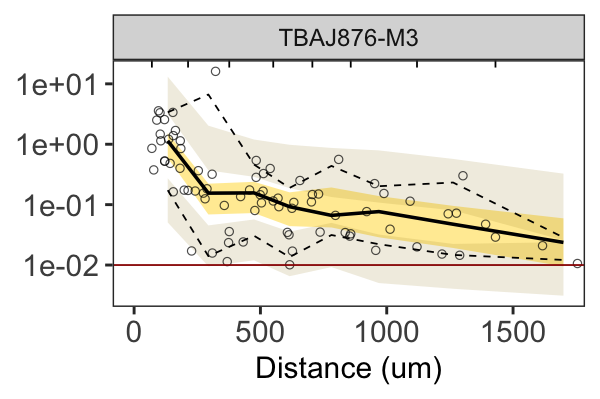

In [76]:
options(repr.plot.width = 5, repr.plot.height = 3.33)
tbaj876_m3_p <- vpc::vpc(sim= met_sdsim_dist, obs = met_sd_dist, 
                                lloq = 0.010, 
                             show=list(obs_dv=T),
                             ylab = "Caseum\nconcentration (ng/mL)", 
                             xlab = "Distance (um)", 
                             vpc_theme=(vpc::new_vpc_theme(update = list(
                                obs_color = "black",
                                sim_median_fill=color_list_876[1],
                      sim_pi_fill=color_list_876[2],
                                sim_median_alpha=0.5,
                                obs_size = 2))),
                         bins='jenks',
                            log_y =T) +
  coord_cartesian(xlim = c(0, 1700)) +
  theme_bw(base_size=18)+
  scale_y_log10(label=scales::scientific) +
  facet_wrap(~overall,ncol=1)+
  theme(panel.grid = element_blank())+
  theme(axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
  ylab(NULL)

tbaj876_m3_p

### ALL DARQS PLOTS

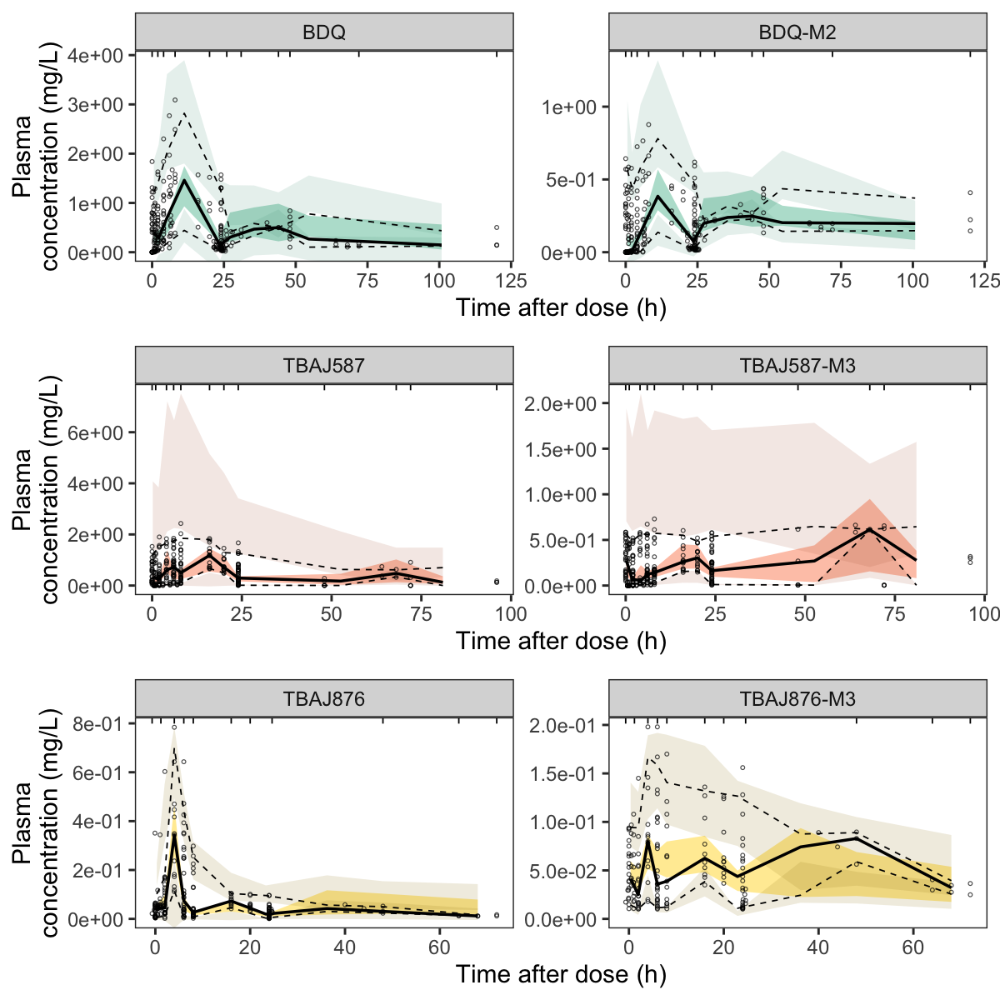

In [77]:
options(repr.plot.width = 10, repr.plot.height = 10)
plasma_vpc <- plot_grid(bdq_plasma,s587_plasma,s876_plasma, nrow = 3,align="hv")
plasma_vpc

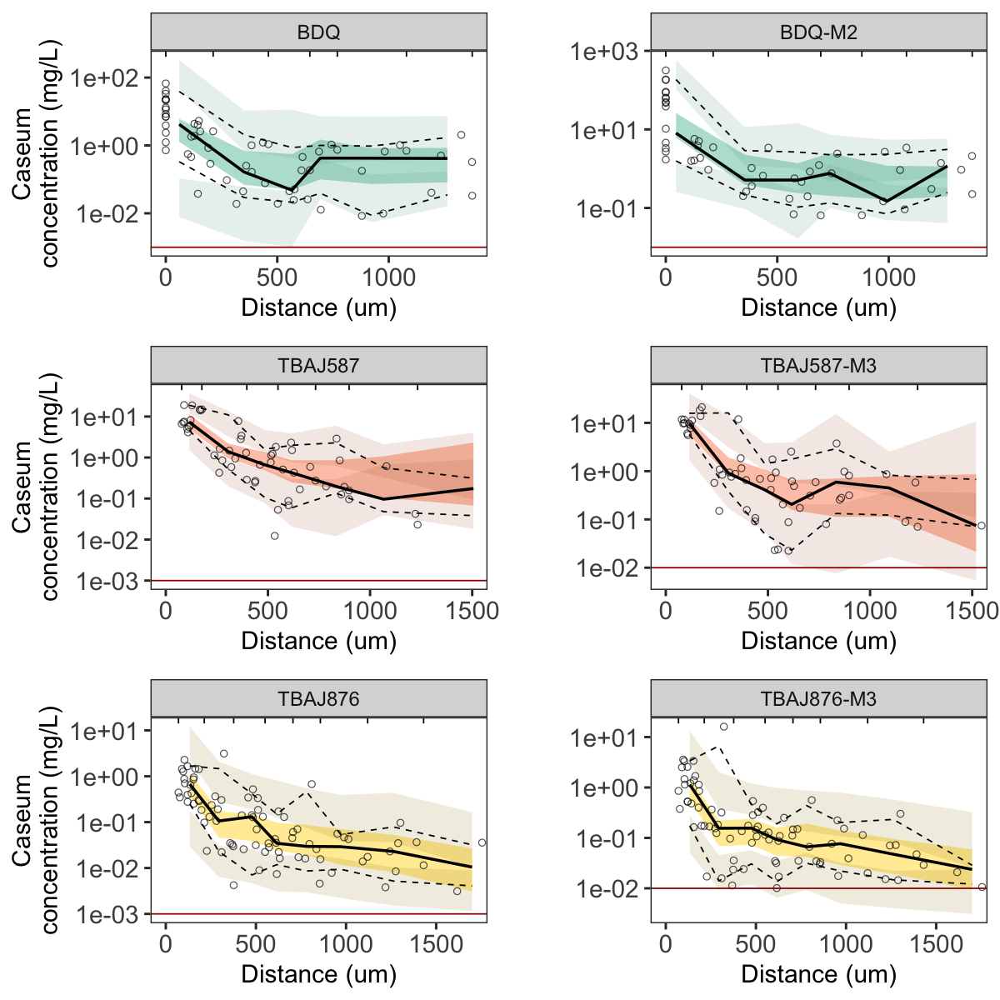

In [78]:
options(repr.plot.width = 10, repr.plot.height = 10)
lesion_vpc <- plot_grid(bdq_p,  bdq_m2_p,
          tbaj587_p, tbaj587_m3_p,
          tbaj876_p,tbaj876_m3_p,
          ncol = 2,align="hv")
lesion_vpc

## PC equation plot

In [79]:
compounds <- c('BDQ', 'TBAJ-587', 'TBAJ-876', 'BDQ-M2', 'TBAJ-587-M3', 'TBAJ-876-M3')

In [80]:
color_list <- c("#66C2A5", "#FC8D62", "#FFD92F", 
                "#58A18C","#B7694B", "#9C841C")

In [81]:
fun.1 <- function(x) {exp(8.011)/x**1.094} # BDQ D01
fun.2 <- function(x) {exp(11.29)/x**1.641} # 587 D01
fun.3 <- function(x) {exp(12.73)/x**1.987} # 876 D86

fun.4 <- function(x) {exp(9.387)/x**1.116} # BDQ M2 D01
fun.5 <- function(x) {exp(12.97)/x**1.868} # 587 M3 D01
fun.6 <- function(x) {exp(14.05)/x**2.175} # 876 M3 D87

options(repr.plot.width = 8, repr.plot.height = 4)
p1<-ggplot() + 
  lapply(1:3, function(i) {
    fun_name <- paste0("fun.", i)
    fun <- get(fun_name)
    line <- geom_function(fun = fun,size=3,
                          aes(colour = compounds[i]))})+
scale_color_manual(values = color_list[1:3]) +
  theme_classic()+
  scale_y_log10(labels = function(x) format(x, scientific = FALSE))+
  xlim(0,1000)+theme(text = element_text(size=28))+
  labs(x = "Distance from caseum border (um)",
       y = "Partition Coefficient",title="Parent compounds")+
                theme_bw(base_size=28)+
  theme(legend.direction = "horizontal",
        legend.position = "bottom",
        strip.background =element_rect(fill="transparent"),
        strip.text = element_text(size=28))+
  theme(legend.title=element_blank())

In [82]:
options(repr.plot.width = 8, repr.plot.height = 4)
p2<-ggplot() + 
  lapply(4:6, function(i) {
    fun_name <- paste0("fun.", i)
    fun <- get(fun_name)
    line <- geom_function(fun = fun,size=3,
                          aes(colour = compounds[i]))})+
scale_color_manual(values = color_list[4:6]) +
  theme_classic()+
  scale_y_log10(labels = function(x) format(x, scientific = FALSE))+
  xlim(0,1000)+theme(text = element_text(size=28))+
  labs(x = "Distance from caseum border (um)",
       y = "Partition Coefficient",title="Metabolite compounds")+
                theme_bw(base_size=28)+
  theme(legend.direction = "horizontal",
        legend.position = "bottom",
        strip.background =element_rect(fill="transparent"),
        strip.text = element_text(size=28))+
  theme(legend.title=element_blank())

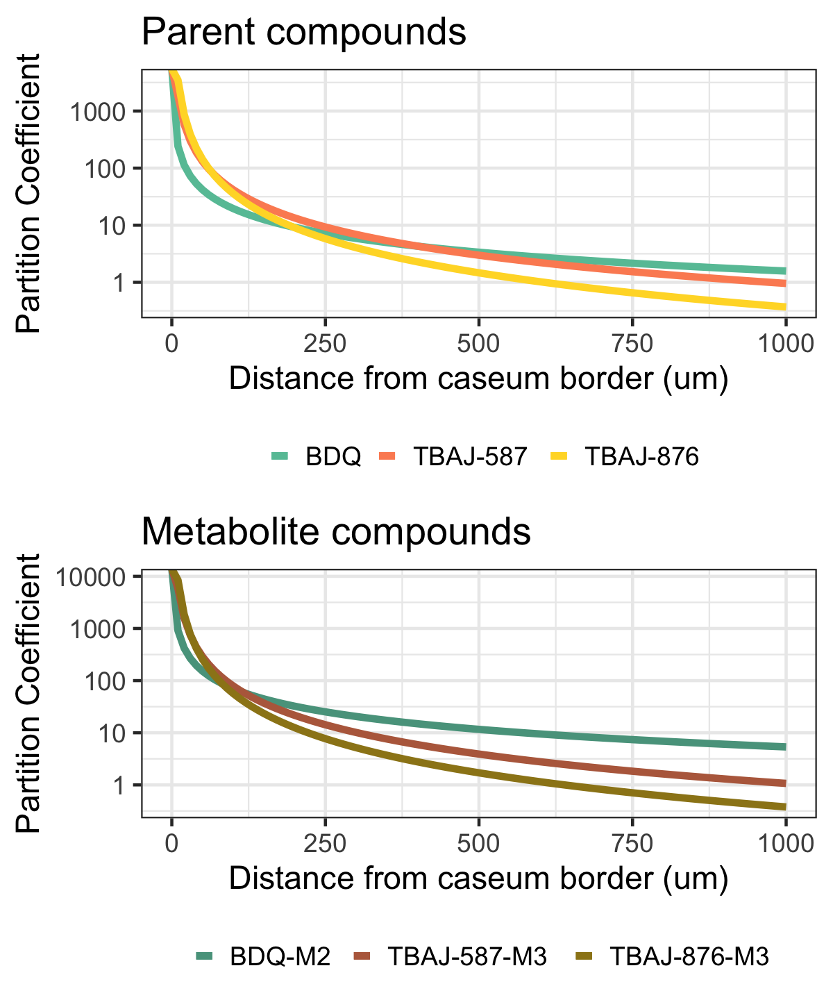

In [83]:
options(repr.plot.width = 10, repr.plot.height = 12)
pc_plot <- plot_grid(p1, p2, ncol = 1,align="hv")
pc_plot

# casMBC visualization and calculations

In [84]:
cas_df <- read.csv(paste(data_dir,"casMBC_diarylquinolines_14days_parsed.csv",sep=''))

In [85]:
cas_df$log10CFU <- log10(cas_df$CFU.mL) # to create log10CFU figure for Vero

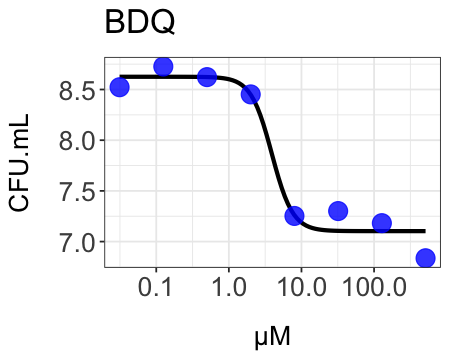

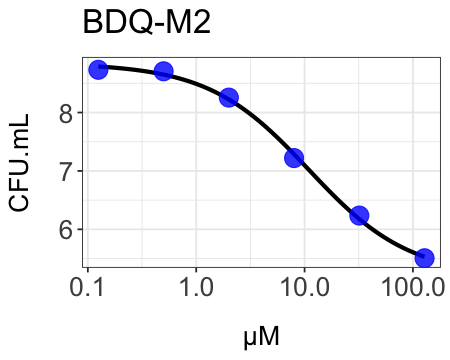

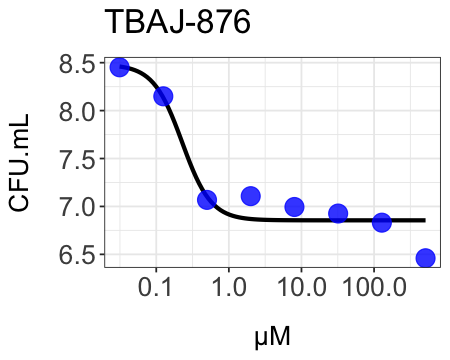

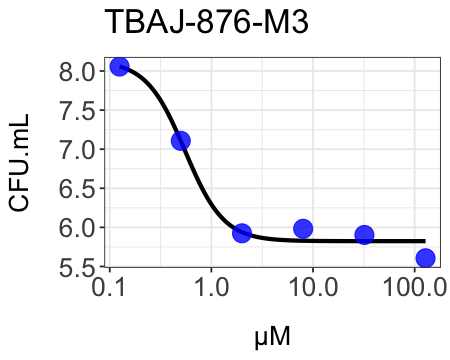

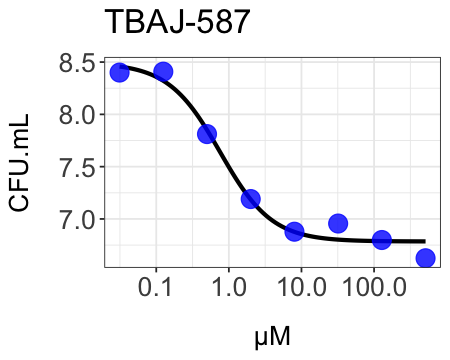

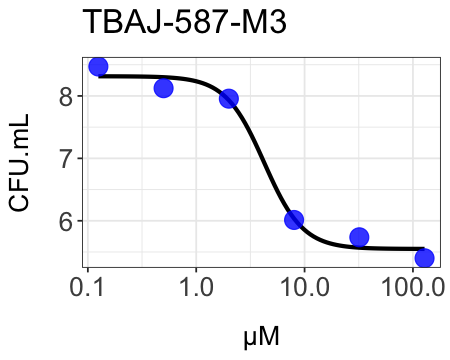

In [86]:
options(repr.plot.width = 3.75, repr.plot.height = 3)
for(cmpd in unique(cas_df$CMPD)) {
    cmpd_df <- cas_df %>% 
      filter(CMPD == cmpd)
    cas_data <- cmpd_df[c('CMPD','µM','log10CFU')]
    dr4pl.logistic.5 <- dr4pl(log10CFU~µM, data = cas_data,method.init = "logistic")
    p<-plot(dr4pl.logistic.5, text.title = cmpd,text.x = "µM", text.y = "CFU.mL")
    print(p)
}

## in vitro data dict

In [87]:
mol_weights <- c("BDQ" = 555.5,
                 "BDQ-M2" = 541.5,
                 "TBAJ-587" = 614.5,
                 "TBAJ-587-M3" = 600.5,
                 "TBAJ-876" = 657.5,
                 "TBAJ-876-M3" = 643.5)

In [88]:
ivt_df <- data.frame(value_mgL = numeric(), METAB = character(), TARGET = character(), stringsAsFactors = FALSE)

for(cmpd in unique(cas_df$CMPD)) {

    cmpd_df <- cas_df %>% 
      filter(CMPD == cmpd)
    cas_data <- cmpd_df[c('CMPD','µM','CFU.mL')]
    
    dr4pl.logistic.5 <- dr4pl(CFU.mL~µM, data = cas_data,method.init = "logistic")
    values <- IC(dr4pl.logistic.5, c(10,50,90))
    
    ts <- as.data.frame(values)
    ts$METAB <- cmpd
    colnames(ts)[colnames(ts) == "values"] <- "value_uM"
    ts$TARGET <- row.names(ts)
    row.names(ts) <- NULL
    
    ts$TARGET[ts$TARGET == "InhibPercent:10"] <- "casMBC90"
    ts$TARGET[ts$TARGET == "InhibPercent:50"] <- "casMBC50"
    ts$TARGET[ts$TARGET == "InhibPercent:90"] <- "casMBC10"
    
    ts$value_mgL <- ts$value_uM*(mol_weights[cmpd]/1000)
    
    ivt_df <- rbind(ivt_df, ts)
    #row.names(ivt_df) <- NULL
}

In [89]:
ivt_df %>%
  mutate_if(is.numeric, ~ round(., 3))

value_uM,METAB,TARGET,value_mgL
<dbl>,<chr>,<chr>,<dbl>
4.124,BDQ,casMBC90,2.291
2.336,BDQ,casMBC50,1.298
1.323,BDQ,casMBC10,0.735
3.681,BDQ-M2,casMBC90,1.993
1.496,BDQ-M2,casMBC50,0.810
0.608,BDQ-M2,casMBC10,0.329
0.154,TBAJ-876,casMBC90,0.101
0.124,TBAJ-876,casMBC50,0.082
0.100,TBAJ-876,casMBC10,0.066


## BLQ dicts

In [90]:
blq_bdq <- tribble(
  ~METAB, ~TARGET, ~value_mgL,
  "BDQ", "blq", (1/1000),
  "BDQ-M2", "blq", (10/1000))

In [91]:
blq_587 <- tribble(
  ~METAB, ~TARGET, ~value_mgL,
  "TBAJ-587", "blq", (1/1000),
  "TBAJ-587-M3", "blq", (10/1000))

In [92]:
blq_876 <- tribble(
  ~METAB, ~TARGET, ~value_mgL,
  "TBAJ-876", "blq", (1/1000),
  "TBAJ-876-M3", "blq", (10/1000)) 

## MIC dicts

In [93]:
mic_dict <- tribble(
  ~METAB, ~TARGET, ~value_mgL,
  "BDQ", "MIC", (0.1),
  "BDQ-M2", "MIC", (0.47),
  "TBAJ-587", "MIC", (0.01),
  "TBAJ-587-M3", "MIC", (0.11),
  "TBAJ-876", "MIC", (0.01),
  "TBAJ-876-M3", "MIC", (0.03))

# Clinical simulations

In [94]:
clin_bdq_dir="./final_mods/clinical_sim/BDQ/"

In [95]:
clin_587_dir="./final_mods/clinical_sim/TBAJ587/"

In [96]:
clin_876_dir="./final_mods/clinical_sim/TBAJ876/"

## Time to casMBC90 at 300um distance

### BDQ

In [97]:
ivt <- ivt_df %>% 
      filter((METAB == "BDQ")|(METAB=='BDQ-M2'))

In [98]:
# clinical simulation of the first month
SIM_1 <- read_nm_tables((paste(clin_bdq_dir,"/","sdtabB05", sep ="")))

SIM_1_to_plot <- SIM_1 %>% 
  select(ID, TIME, DIST, CPP, CPM, AA9, AA10) %>%
  rename(BDQ_plasma = CPP, 
         M2_plasma = CPM,  
         BDQ_caseum = AA9,
         M2_caseum = AA10) %>% 
  gather(key = "CMT", value = mg.L, 4:7) %>% 
  mutate(DV  = exp(mg.L)) %>% 
  mutate(METAB = ifelse(grepl("M2",CMT),"BDQ-M2","BDQ"),
         LESION = ifelse(grepl("plasma",CMT),"Plasma","Caseum"))

SIM_1_to_plot$TIME_MONTHS <- SIM_1_to_plot$TIME/24/7/4

SIM_1_to_plot_summ <- SIM_1_to_plot %>% 
  filter(ifelse(METAB=="BDQ-M2" & TIME > 14*24, TIME == c(28*24), TIME==TIME)) %>% 
  group_by(CMT,LESION, METAB, TIME) %>% 
  summarise(medDV = median(DV),
            loDV = quantile(DV,0.05),
            hiDV = quantile(DV,0.95))


Looking for nonmem output tables.

Reading: sdtabB05 [$prob no.1]

`summarise()` has grouped output by 'CMT', 'LESION', 'METAB'. You can override using the
`.groups` argument.


In [99]:
options(repr.plot.width = 6, repr.plot.height = 8)

first_mos_bdq <- ggplot(SIM_1_to_plot_summ, mapping = aes(x = TIME, y = medDV, 
                                                          group = LESION, color=LESION, fill=LESION))+
  geom_line(size=1)+
  geom_ribbon(aes(ymin=loDV,ymax=hiDV),color=NA, alpha=0.25)+
  facet_wrap(~METAB,ncol=2)+
  scale_x_continuous(limits=c(0,4*7*24), breaks=seq(0,4*7*24, 7*24), labels = c(0,1,2,3,4))+
  scale_y_continuous(breaks = seq(0,16,2))+
  scale_y_log10(limits = c(0.001, 15),label=scales::scientific)+
  geom_hline(ivt[ivt$TARGET=="casMBC90",],mapping=aes(yintercept = value_mgL),
             linetype="dashed", size = 1, color = "orangered")+
  theme_bw(base_size=18)+
  xlab("Time (weeks)")+
  scale_color_manual(values=c("blue","navy"), 
                     labels = c("Caseum", "Plasma"), name = "")+
  scale_fill_manual(values=c("blue","navy"))+
  guides(fill="none")+
  ylab("Concentration (mg/L)")+
  theme(strip.background = element_rect("transparent"),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18),
        axis.text = element_text(size=18),
        axis.title = element_text(size=18),
        legend.direction = "horizontal",
        legend.position = "none")

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


Warning message:
“Removed 4 rows containing missing values (`geom_line()`).”


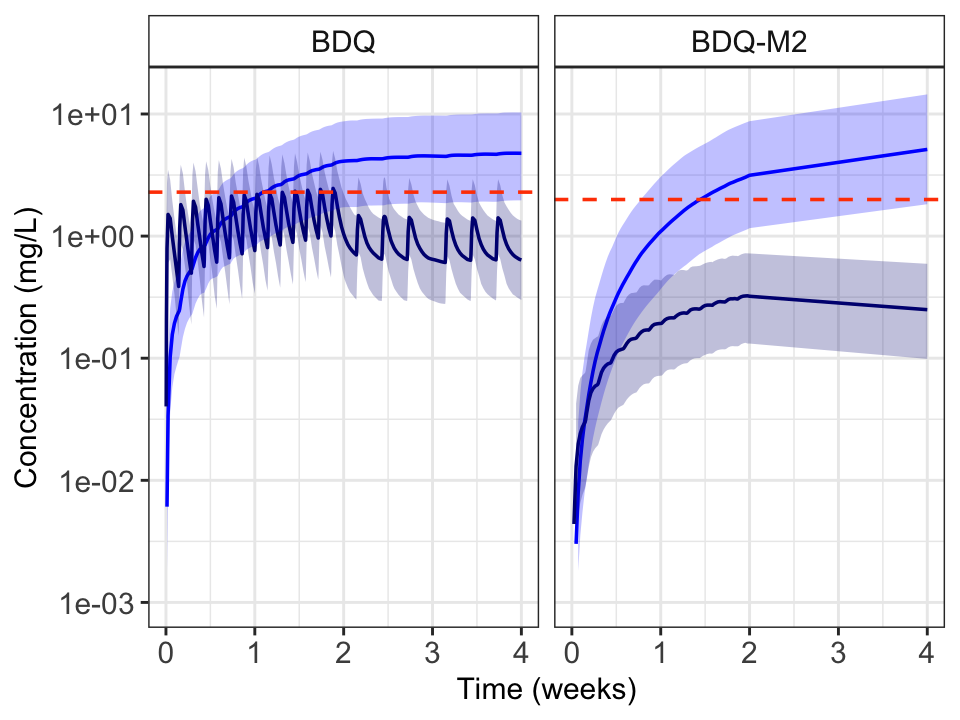

In [100]:
options(repr.plot.width = 8, repr.plot.height = 6)
first_mos_bdq

### TBAJ587

In [102]:
ivt <- ivt_df %>% 
      filter((METAB == "TBAJ-587")|(METAB=='TBAJ-587-M3'))

In [103]:
run <- "sdtabS587_05"

In [104]:
x <- read_nm_tables((paste(clin_587_dir, '/',run,sep=''))) %>% 
  filter(EVID ==0)


Looking for nonmem output tables.

Reading: sdtabS587_05 [$prob no.1]

Warning message:
“There was 1 warning in `dplyr::mutate()`.
ℹ In argument: `table = purrr::map2(.x = .$fun, .y = .$params, .f = do.call)`.
Caused by warning:
! Duplicated column names deduplicated: 'DV' => 'DV_1' [16]”


In [105]:
SIM_1_to_plot <- x %>% 
  select(ID, TIME, DIST, CPP, CPM, AA10, AA11) %>%
  rename(TBAJ587_plasma = CPP,
         M3_plasma = CPM,
         TBAJ587_caseum = AA10,
         M3_caseum = AA11) %>% 
  gather(key = "CMT", value = "lnDV", 4:7) %>% 
  mutate(DV  = exp(lnDV)) %>% 
  mutate(METAB = ifelse(grepl("M3",CMT),"TBAJ-587-M3","TBAJ-587"),
         LESION = ifelse(grepl("plasma",CMT),"Plasma","Caseum"))

In [106]:
SIM_1_to_plot$TIME_WEEKS <- SIM_1_to_plot$TIME/24/7

In [107]:
find_min <- SIM_1_to_plot %>% filter(DV > 1.4) %>% filter(METAB=='TBAJ-587')

In [108]:
SIM_1_to_plot_summ <- SIM_1_to_plot %>% 
  group_by(CMT,LESION, METAB, TIME_WEEKS) %>% 
  summarise(medDV = median(DV),
            loDV = quantile(DV,0.05),
            hiDV = quantile(DV,0.95))

`summarise()` has grouped output by 'CMT', 'LESION', 'METAB'. You can override using the
`.groups` argument.


Warning message:
“Removed 10 rows containing missing values (`geom_line()`).”


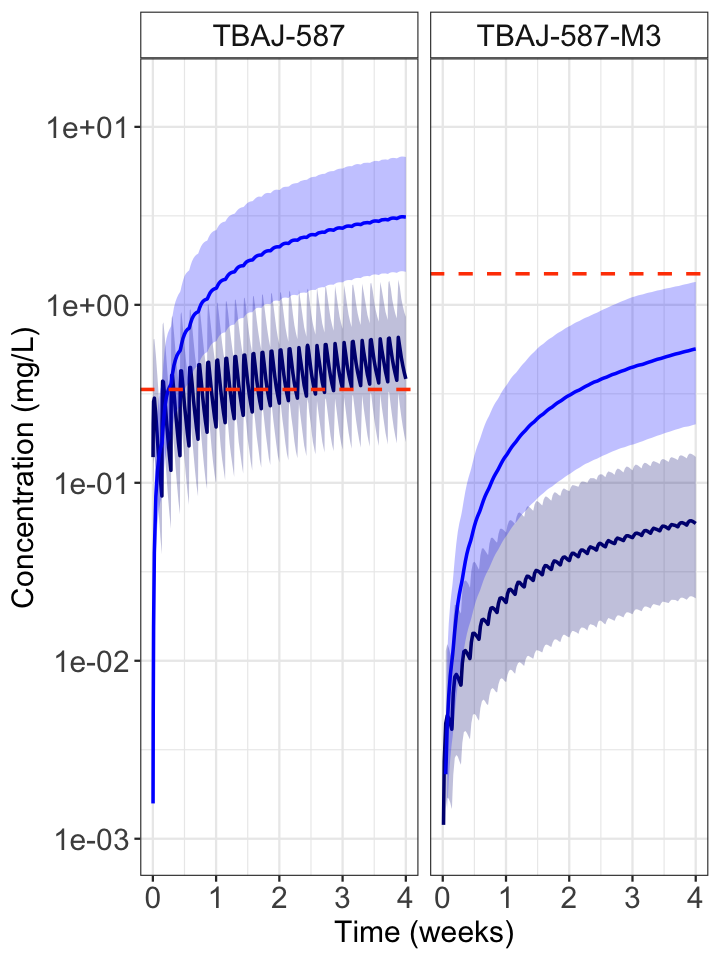

In [109]:
options(repr.plot.width = 6, repr.plot.height = 8)

first_mos_S587<-ggplot(SIM_1_to_plot_summ, mapping = aes(x = TIME_WEEKS, y = medDV, group = rev(CMT), 
                                                         color=factor(LESION),fill=factor(LESION)))+
  geom_line(size=1)+
  geom_ribbon(aes(ymin=loDV,ymax=hiDV),color=NA, alpha=0.25)+
  facet_wrap(~METAB,ncol=2)+
  #scale_y_log10()+
  scale_y_log10(limits = c(0.001, 15),label=scales::scientific)+
  geom_hline(ivt[ivt$TARGET=="casMBC90",],mapping=aes(yintercept = value_mgL),linetype="dashed", 
             size = 1, color = "orangered")+
  theme_bw(base_size=14)+
  xlab("Time (weeks)")+
  scale_color_manual(values=c("blue","navy"), labels = c("Caseum", "Plasma"), name = "")+
  scale_fill_manual(values=c("blue","navy"), labels = c("Caseum", "Plasma"), name = "")+
  guides(fill="none")+
  ylab("Concentration (mg/L)")+
  theme(strip.background = element_rect("transparent"),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18),
        legend.direction = "horizontal",
        axis.text = element_text(size=18),
        axis.title = element_text(size=18),
        legend.position = "none")

first_mos_S587

### TBAJ876

In [110]:
ivt <- ivt_df %>% 
      filter((METAB == "TBAJ-876")|(METAB=='TBAJ-876-M3'))

In [111]:
SIM_1 <- read_nm_tables((paste(clin_876_dir,"/","sdtabS41", sep =""))) %>% 
  filter(EVID ==0)


Looking for nonmem output tables.

Reading: sdtabS41 [$prob no.1]

Warning message:
“There was 1 warning in `dplyr::mutate()`.
ℹ In argument: `table = purrr::map2(.x = .$fun, .y = .$params, .f = do.call)`.
Caused by warning:
! Duplicated column names deduplicated: 'DV' => 'DV_1' [12]”


In [112]:
SIM_1_to_plot <- SIM_1 %>% 
  select(ID, TIME, DIST, CPP, CPM, AA11, AA12) %>%
  rename(TBAJ876_plasma = CPP,
         M3_plasma = CPM,
         TBAJ876_caseum = AA11,
         M3_caseum = AA12) %>% 
  gather(key = "CMT", value = "lnDV", 4:7) %>%  
  mutate(DV  = exp(lnDV)) %>% 
  mutate(METAB = ifelse(grepl("M3",CMT),"TBAJ-876-M3","TBAJ-876"),
         LESION = ifelse(grepl("plasma",CMT),"Plasma","Caseum"))

SIM_1_to_plot$TIME_WEEKS <- SIM_1_to_plot$TIME/24/7

SIM_1_to_plot_summ <- SIM_1_to_plot %>% 
  group_by(CMT,LESION, METAB, TIME_WEEKS) %>% 
  summarise(medDV = median(DV),
            loDV = quantile(DV,0.05),
            hiDV = quantile(DV,0.95))

`summarise()` has grouped output by 'CMT', 'LESION', 'METAB'. You can override using the
`.groups` argument.


In [113]:
options(repr.plot.width = 6, repr.plot.height = 8)

first_mos_S876<-ggplot(SIM_1_to_plot_summ, mapping = aes(x = TIME_WEEKS, y = medDV, group = rev(CMT), 
                                                         color=factor(LESION),fill=factor(LESION)))+
  geom_line(size=1)+
  geom_ribbon(aes(ymin=loDV,ymax=hiDV),color=NA, alpha=0.25)+
  facet_wrap(~METAB,ncol=2)+
  #scale_y_log10()+
  scale_y_log10(limits = c(0.001, 15),label=scales::scientific)+
  geom_hline(ivt[ivt$TARGET=="casMBC90",],mapping=aes(yintercept = value_mgL),linetype="dashed", 
             size = 1, color = "orangered")+
  theme_bw(base_size=14)+
  xlab("Time (weeks)")+
  scale_color_manual(values=c("blue","navy"), labels = c("Caseum", "Plasma"), name = "")+
  scale_fill_manual(values=c("blue","navy"), labels = c("Caseum", "Plasma"), name = "")+
  guides(fill="none")+
  ylab("Concentration (mg/L)")+
  theme(strip.background = element_rect("transparent"),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18),
        legend.direction = "horizontal",
        axis.text = element_text(size=18),
        axis.title = element_text(size=18),
        legend.position = "none")

Warning message:
“Removed 8 rows containing missing values (`geom_line()`).”


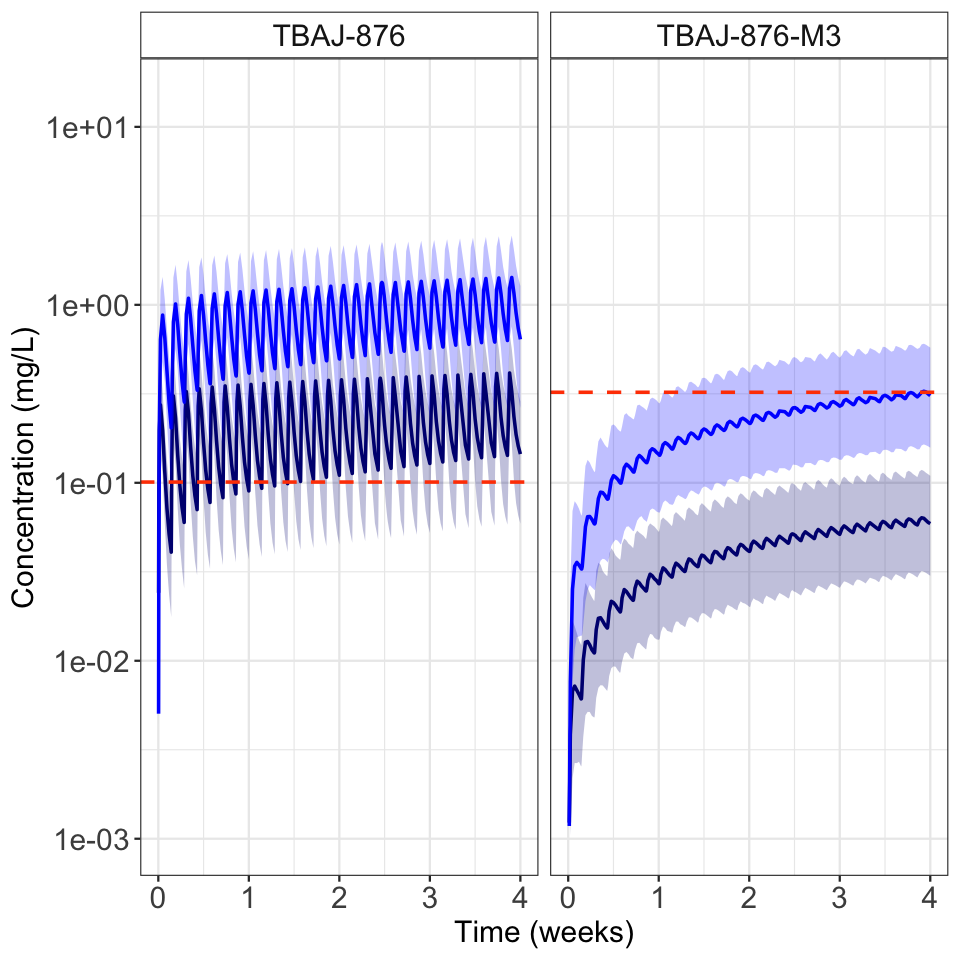

In [114]:
options(repr.plot.width = 8, repr.plot.height = 8)
first_mos_S876

### ALL DARQS PLOT

Warning message:
“Removed 4 rows containing missing values (`geom_line()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_line()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_line()`).”


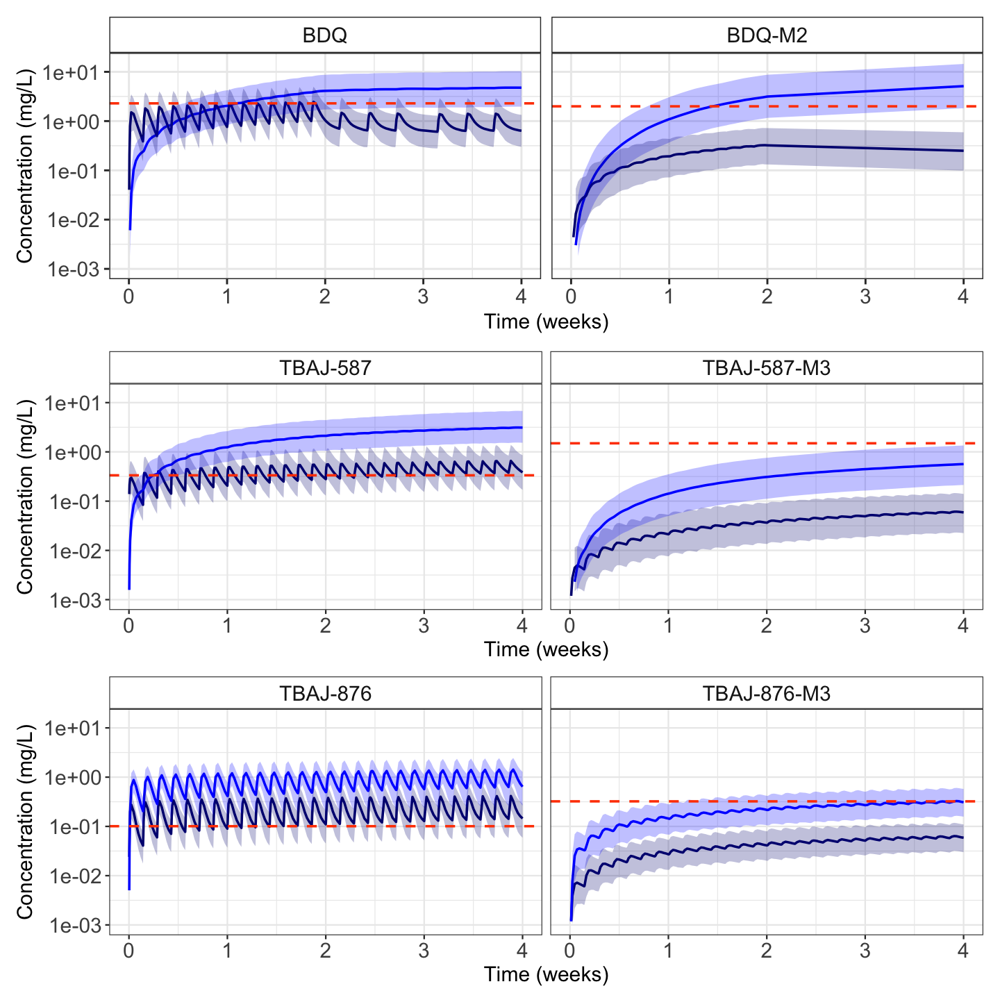

In [115]:
options(repr.plot.width = 12, repr.plot.height = 12)
fig3a <- first_mos_bdq + first_mos_S587 + first_mos_S876 +
  plot_layout(ncol = 1, nrow = 3, guides = "collect")
fig3a

## Concentration over time, stratified by distance

### BDQ

In [116]:
ivt <- ivt_df %>% 
      filter((METAB == "BDQ")|(METAB=='BDQ-M2'))

mic <- mic_dict %>% 
      filter((METAB == "BDQ")|(METAB=='BDQ-M2'))

In [117]:
SIM_1 <- read_nm_tables((paste(clin_bdq_dir,"/","sdtabB04", sep ="")))


Looking for nonmem output tables.

Reading: sdtabB04 [$prob no.1]



Warning message:
“Removed 10350 rows containing missing values (`geom_line()`).”


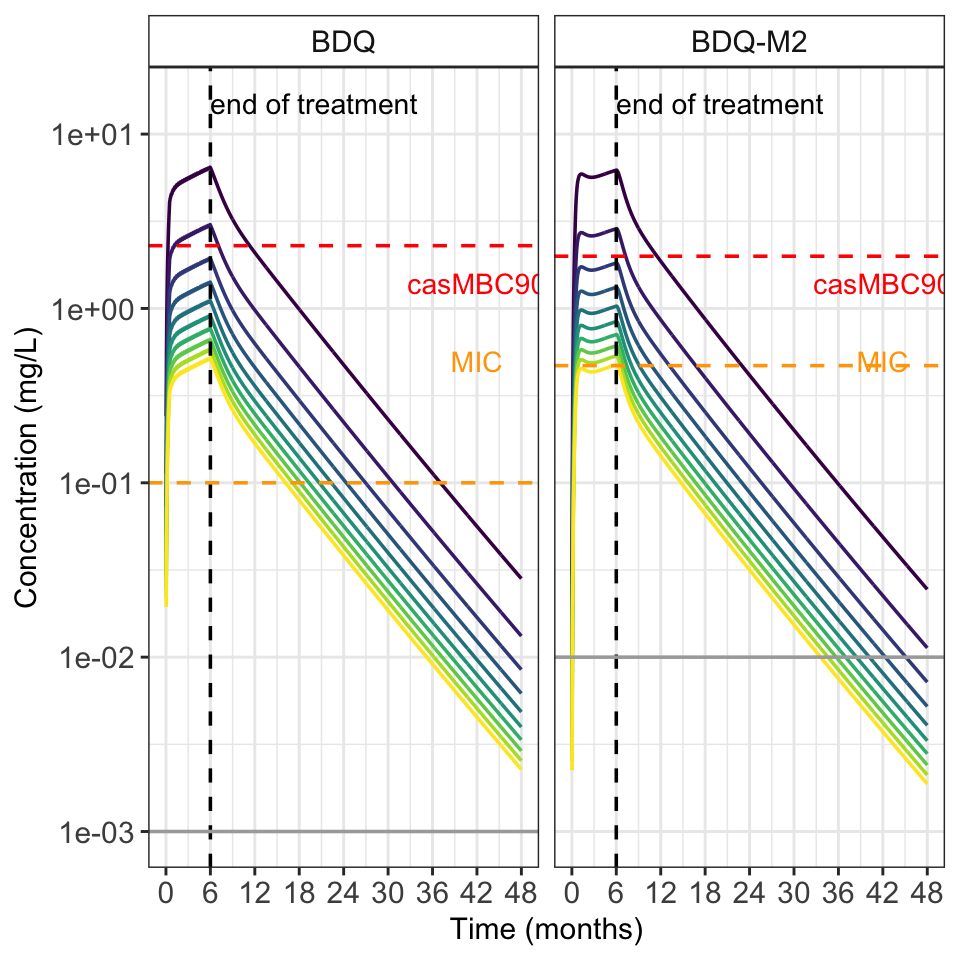

In [118]:
SIM_1_to_plot <- SIM_1 %>% 
  select(ID, TIME, DIST, CPP, CPM, AA9, AA10) %>%
  rename(BDQ_plasma = CPP,
         M2_plasma = CPM,
         BDQ_caseum = AA9,
         M2_caseum = AA10) %>% 
  gather(key = "CMT", value = mg.L, 4:7) %>% 
  mutate(DV  = exp(mg.L)) %>% 
  mutate(METAB = ifelse(grepl("M2",CMT),"BDQ-M2","BDQ"),
         LESION = ifelse(grepl("plasma",CMT),"Plasma","Caseum"))

SIM_1_to_plot$TIME_MONTHS <- SIM_1_to_plot$TIME/24/7/4

options(repr.plot.width = 8, repr.plot.height = 8)
bdq_dist_line <- ggplot(subset(SIM_1_to_plot, grepl(pattern =  "aseum", SIM_1_to_plot$CMT) & DIST <=3000), 
                        mapping = aes(x = TIME_MONTHS, y = DV, color = factor(DIST)))+
  geom_line(size=1)+
  facet_wrap(~METAB,ncol=2)+
  scale_y_log10(limits = c(0.001, 15),label=scales::scientific)+
  theme_bw(base_size=18)+
  scale_x_continuous(breaks = seq(0,48,6), limits = c(NA, 48))+
  ylab("Concentration (mg/L)")+
  xlab("Time (months)")+ 
  viridis::scale_color_viridis(discrete = TRUE, name="Distance from\nborder (um)")+
  geom_vline(xintercept = 6, linetype="dashed", color="black", size=1)+
  geom_hline(blq_bdq[blq_bdq$TARGET=="blq",],mapping=aes(yintercept = value_mgL), 
             size = 1, color = "darkgrey")+
  geom_hline(ivt[ivt$TARGET=="casMBC90",],mapping=aes(yintercept = value_mgL),linetype="dashed", 
             size = 1, color = "red")+
  geom_hline(mic[mic$TARGET=="MIC",],mapping=aes(yintercept = value_mgL),linetype="dashed", 
             size = 1, color = "orange")+
  theme(strip.background = element_rect(fill="transparent"),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18),
        legend.position="none",
        axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
  #guides(colour = guide_legend(nrow = 4))+
  annotate("text", x=42, y=1.4, label= "casMBC90", color = "red", size=6)+
  annotate("text", x=42, y=0.5, label= "MIC", color = "orange", size=6)+
  annotate("text", x=20, y=15, label= "end of treatment", color = "black", size=6)
bdq_dist_line

### TBAJ587

In [119]:
ivt <- ivt_df %>% 
      filter((METAB == "TBAJ-587")|(METAB=='TBAJ-587-M3'))

mic <- mic_dict %>% 
      filter((METAB == "TBAJ-587")|(METAB=='TBAJ-587-M3'))

In [120]:
x <- read_nm_tables((paste(clin_587_dir, '/sdtabS587_04',sep=''))) %>% 
  filter(EVID ==0)


Looking for nonmem output tables.

Reading: sdtabS587_04 [$prob no.1]

Warning message:
“There was 1 warning in `dplyr::mutate()`.
ℹ In argument: `table = purrr::map2(.x = .$fun, .y = .$params, .f = do.call)`.
Caused by warning:
! Duplicated column names deduplicated: 'DV' => 'DV_1' [16]”


Warning message:
“Removed 16706 rows containing missing values (`geom_line()`).”


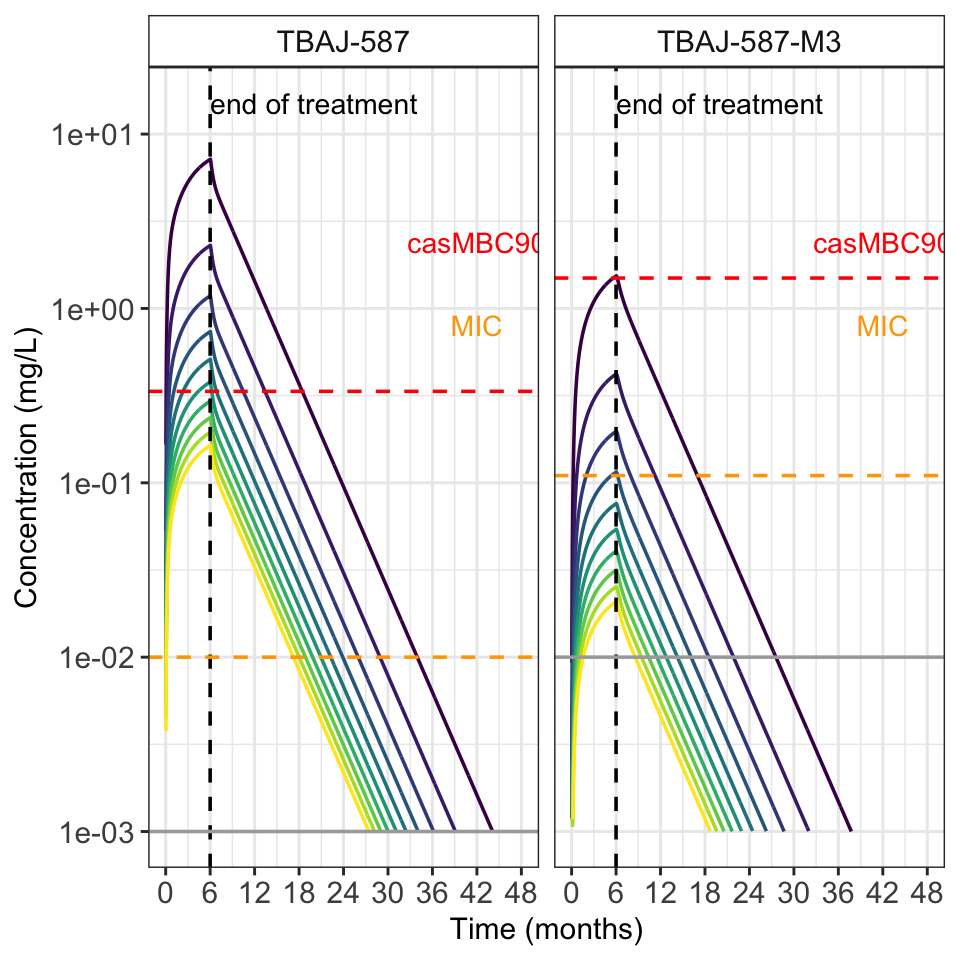

In [121]:
SIM_1_to_plot <- x %>% 
  select(ID, TIME, DIST, CPP, CPM, AA10, AA11) %>%
  rename(TBAJ587_plasma = CPP,
         M3_plasma = CPM,
         TBAJ587_caseum = AA10,
         M3_caseum = AA11) %>% 
  gather(key = "CMT", value = mg.L, 4:7) %>% 
  mutate(DV  = exp(mg.L)) %>% 
  mutate(METAB = ifelse(grepl("M3",CMT),"TBAJ-587-M3","TBAJ-587"),
         LESION = ifelse(grepl("plasma",CMT),"Plasma","Caseum"))

SIM_1_to_plot$TIME_MONTHS <- SIM_1_to_plot$TIME/24/7/4

options(repr.plot.width = 8, repr.plot.height = 8)
s587_dist_line <- ggplot(subset(SIM_1_to_plot, grepl(pattern =  "aseum", SIM_1_to_plot$CMT) & DIST <=3000), 
                         mapping = aes(x = TIME_MONTHS, y = DV, color = factor(DIST)))+
  geom_line(size=1)+
  facet_wrap(~METAB,ncol=2)+
  scale_y_log10(limits = c(0.001, 15),label=scales::scientific)+
  theme_bw(base_size=18)+
  scale_x_continuous(breaks = seq(0,48,6), limits = c(NA, 48))+
  ylab("Concentration (mg/L)")+
  xlab("Time (months)")+ 
  viridis::scale_color_viridis(discrete = TRUE, name="Distance from\nborder (um)")+
  geom_vline(xintercept = 6, linetype="dashed", color="black", size=1)+
  geom_hline(blq_587[blq_587$TARGET=="blq",],mapping=aes(yintercept = value_mgL), 
             size = 1, color = "darkgrey")+
  geom_hline(ivt[ivt$TARGET=="casMBC90",],mapping=aes(yintercept = value_mgL),linetype="dashed", 
             size = 1, color = "red")+
  geom_hline(mic[mic$TARGET=="MIC",],mapping=aes(yintercept = value_mgL),linetype="dashed", 
             size = 1, color = "orange")+
  theme(strip.background = element_rect(fill="transparent"),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18),
        legend.position="none",
        axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
#guides(colour = guide_legend(nrow = 4))+
  annotate("text", x=42, y=2.4, label= "casMBC90", color = "red", size=6)+
  annotate("text", x=42, y=0.8, label= "MIC", color = "orange", size=6)+
  annotate("text", x=20, y=15, label= "end of treatment", color = "black", size=6)
s587_dist_line

### TBAJ876

In [122]:
ivt <- ivt_df %>% 
      filter((METAB == "TBAJ-876")|(METAB=='TBAJ-876-M3'))

mic <- mic_dict %>% 
      filter((METAB == "TBAJ-876")|(METAB=='TBAJ-876-M3'))

In [123]:
x <- read_nm_tables((paste(clin_876_dir, '/',"sdtabS40",sep=''))) %>% 
  filter(EVID ==0)


Looking for nonmem output tables.

Reading: sdtabS40 [$prob no.1]

Warning message:
“There was 1 warning in `dplyr::mutate()`.
ℹ In argument: `table = purrr::map2(.x = .$fun, .y = .$params, .f = do.call)`.
Caused by warning:
! Duplicated column names deduplicated: 'DV' => 'DV_1' [12]”


In [124]:
SIM_1_to_plot <- x %>% 
  select(ID, TIME, DIST, CPP, CPM, AA11, AA12) %>%
  rename(TBAJ876_plasma = CPP,
         M3_plasma = CPM,
         TBAJ876_caseum = AA11,
         M3_caseum = AA12) %>% 
  gather(key = "CMT", value = "lnDV", 4:7) %>% 
  mutate(DV  = exp(lnDV)) %>% 
  mutate(METAB = ifelse(grepl("M3",CMT),"TBAJ-876-M3","TBAJ-876"),
         LESION = ifelse(grepl("plasma",CMT),"Plasma","Caseum"),
         TIME_MONTHS = TIME/24/7/4)

Warning message:
“Removed 19480 rows containing missing values (`geom_line()`).”


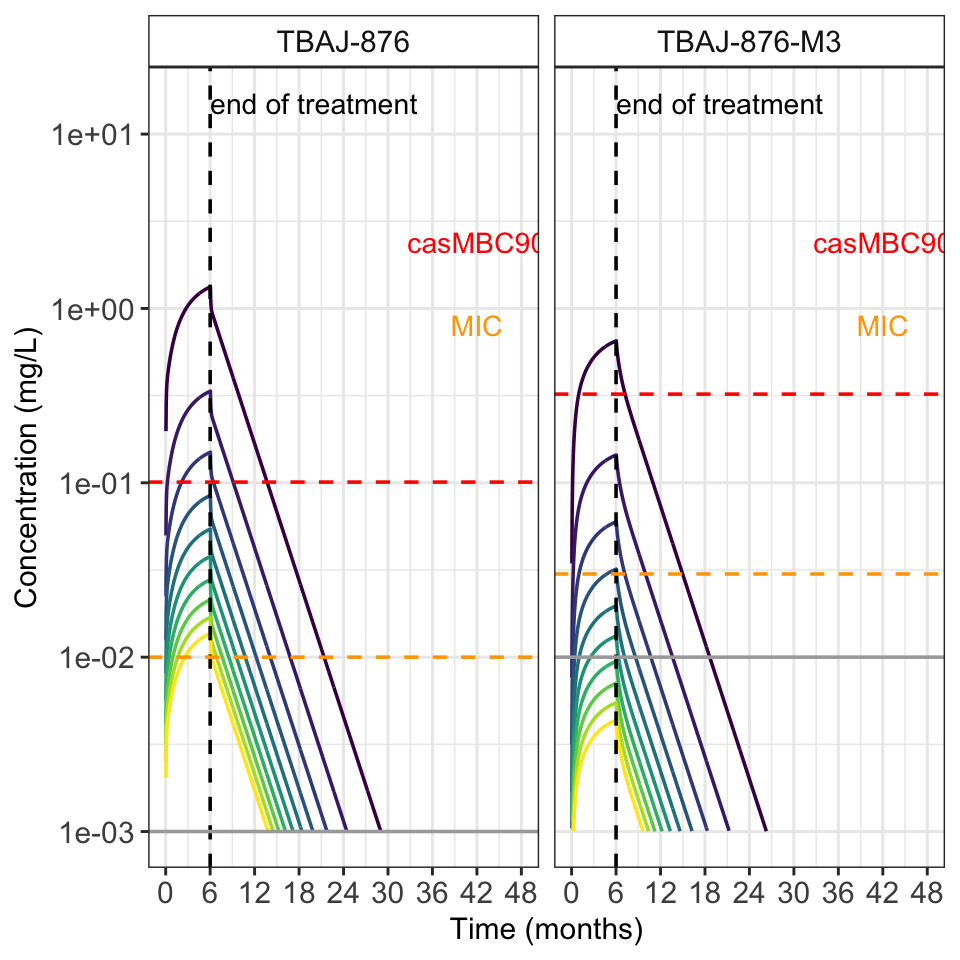

In [125]:
options(repr.plot.width = 8, repr.plot.height = 8)
s876_dist_line <- ggplot(subset(SIM_1_to_plot, grepl(pattern =  "aseum", SIM_1_to_plot$CMT) & DIST <=3000 &DIST>0), 
       mapping = aes(x = TIME_MONTHS, y = DV, color = factor(DIST)))+
  geom_line(size=1)+
  facet_wrap(~METAB,ncol=2)+
  scale_x_continuous(breaks = seq(0,48,6), limits = c(NA, 48))+
  scale_y_log10(limits=c(0.001, 15),label=scales::scientific)+
  ylab("Concentration (mg/L)")+
  xlab("Time (months)")+
  viridis::scale_color_viridis(discrete = TRUE, name="Distance from\nborder (um)")+
  theme_bw(base_size=18)+
  geom_vline(xintercept = 6, linetype="dashed", color="black", size=1)+ # end of tx
  geom_hline(blq_876[blq_876$TARGET=="blq",],mapping=aes(yintercept = value_mgL), 
             size = 1, color = "darkgrey")+
  geom_hline(ivt[ivt$TARGET=="casMBC90",],mapping=aes(yintercept = value_mgL),linetype="dashed", 
             size = 1, color = "red")+
  geom_hline(mic[mic$TARGET=="MIC",],mapping=aes(yintercept = value_mgL),linetype="dashed", 
             size = 1, color = "orange")+
  theme(strip.background = element_rect(fill="transparent"),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18),
        legend.position="none",
        axis.text = element_text(size=18),
        axis.title = element_text(size=18))+
  annotate("text", x=42, y=2.4, label= "casMBC90", color = "red", size=6)+
  annotate("text", x=42, y=0.8, label= "MIC", color = "orange", size=6)+
  annotate("text", x=20, y=15, label= "end of treatment", color = "black", size=6)
s876_dist_line

### ALL DARQS PLOT

Warning message:
“Removed 10350 rows containing missing values (`geom_line()`).”
Warning message:
“Removed 16706 rows containing missing values (`geom_line()`).”
Warning message:
“Removed 19480 rows containing missing values (`geom_line()`).”


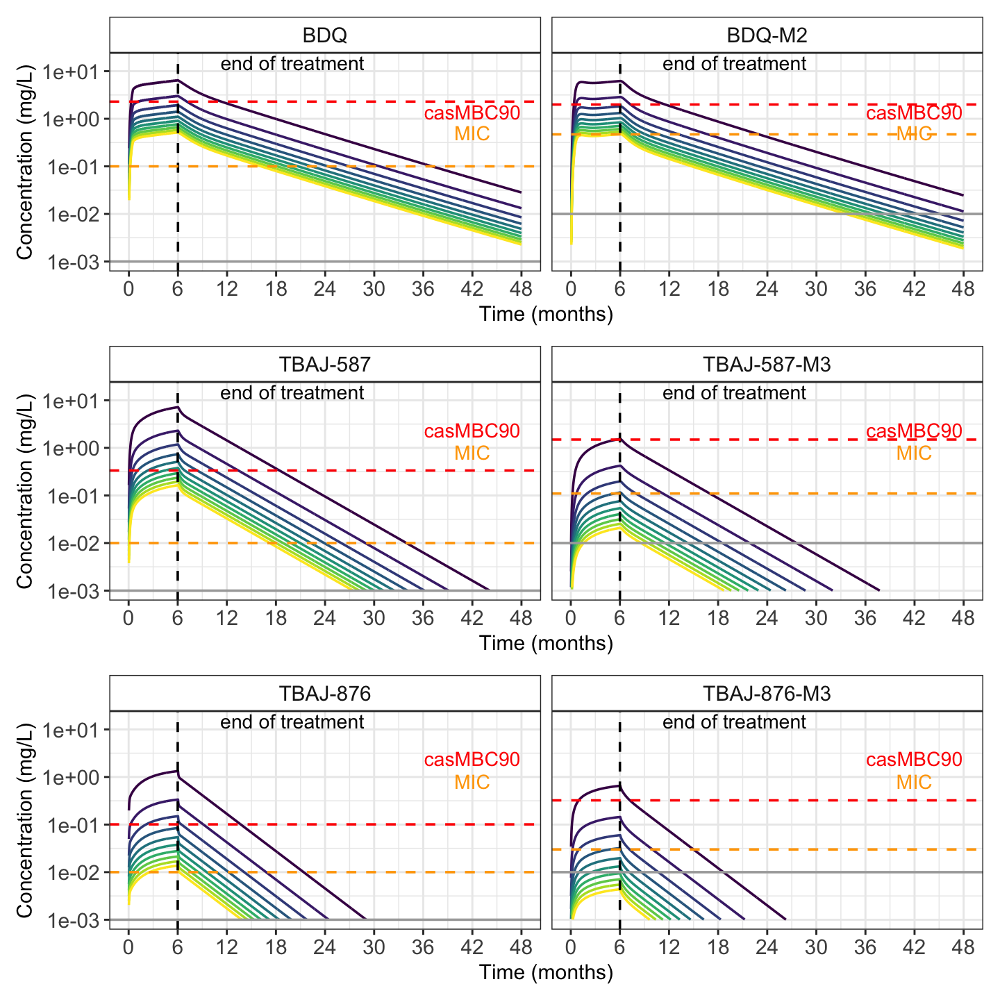

In [126]:
options(repr.plot.width = 12, repr.plot.height = 12)
fig3b <- bdq_dist_line + s587_dist_line + s876_dist_line +
  plot_layout(nrow = 3, guides = "collect")
fig3b

## Tile plots

In [127]:
m_lloq <- 0.01
p_lloq <- 0.001

In [128]:
my_colors_lloq_lowest <- c(
               "0.casMBC10" = "transparent",
               "1.casMBC10" = "lightblue",
               "0.casMBC50" = "transparent",
               "1.casMBC50" = "cornflowerblue",
               "0.casMBC90" = "transparent",
               "1.casMBC90" = 'navy',
               "0.LLOQ" = "transparent",
               "1.LLOQ" = "gray")

In [129]:
my_colors_cas10_lowest <- c(
               "0.casMBC10" = "transparent",
               "1.casMBC10" = "gray",            #casMBC10 needs to be gray bc it's below LLOQ
               "0.casMBC50" = "transparent",
               "1.casMBC50" = "cornflowerblue",
               "0.casMBC90" = "transparent",
               "1.casMBC90" = 'navy',
               "0.LLOQ" = "transparent",
               "1.LLOQ" = "gray")

In [130]:
mic_colors_w_loq_lowest <- c(
               "0.casMBC10" = "transparent",
               "1.casMBC10" = brewer.pal(6, "BrBG")[4],#"lightblue",
               "0.casMBC50" = "transparent",
               "1.casMBC50" = brewer.pal(6, "BrBG")[5],#"cornflowerblue",
               "0.casMBC90" = "transparent",
               "1.casMBC90" = brewer.pal(6, "BrBG")[6],#'navy',
               "0.LLOQ" = "transparent",
               "1.LLOQ" = brewer.pal(6, "BrBG")[2],#"gray",
               "0.MIC" = "transparent",
               "1.MIC" = brewer.pal(6, "BrBG")[3])

In [131]:
mic_colors_w_cas10_lowest <- c(
               "0.casMBC10" = "transparent",
               "1.casMBC10" = brewer.pal(6, "BrBG")[2],#"lightblue",
               "0.casMBC50" = "transparent",
               "1.casMBC50" = brewer.pal(6, "BrBG")[5],#"cornflowerblue",
               "0.casMBC90" = "transparent",
               "1.casMBC90" = brewer.pal(6, "BrBG")[6],#'navy',
               "0.LLOQ" = "transparent",
               "1.LLOQ" = brewer.pal(6, "BrBG")[2],#"gray",
               "0.MIC" = "transparent",
               "1.MIC" = brewer.pal(6, "BrBG")[3])

[1] "#80CDC1"

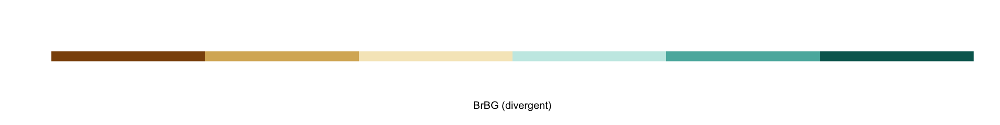

In [132]:
options(repr.plot.width = 16, repr.plot.height = 2)
display.brewer.pal(6, "BrBG")
brewer.pal(8, "BrBG")[6]

### BDQ

In [133]:
ivt <- ivt_df %>% 
      filter((METAB == "BDQ")|(METAB=='BDQ-M2'))

mic <- mic_dict %>% 
      filter((METAB == "BDQ")|(METAB=='BDQ-M2'))

In [134]:
SIM_1 <- read_nm_tables((paste(clin_bdq_dir,"/","sdtabB04", sep ="")))

SIM_1_to_plot <- SIM_1 %>% 
  select(ID, TIME, DIST, CPP, CPM, AA9, AA10) %>%
  rename(BDQ_plasma = CPP,
         M2_plasma = CPM,
         BDQ_caseum = AA9,
         M2_caseum = AA10) %>% 
  gather(key = "CMT", value = lnDV, 4:7) %>% 
  mutate(DV  = exp(lnDV)) %>% 
  mutate(METAB = ifelse(grepl("M2",CMT),"BDQ-M2","BDQ"),
         LESION = ifelse(grepl("plasma",CMT),"Plasma","Caseum"))

SIM_1_to_plot$TIME_MONTHS <- SIM_1_to_plot$TIME/24/7/4


Looking for nonmem output tables.

Reading: sdtabB04 [$prob no.1]



In [135]:
#parent
cmpd <- "BDQ"
flt_gath1 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <=max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC90")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC90")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC90")

flt_gath2 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC50")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC50")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC50")

flt_gath3 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC10")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC10")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC10")

flt_gath_p_lloq <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == "BDQ", p_lloq, p_lloq),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "LLOQ")

#new
flt_gath_p_mic <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         mic[(mic$TARGET=="MIC")&(mic$METAB==cmpd),]$value_mgL, 
                         mic[(mic$TARGET=="MIC")&(mic$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "MIC")

flt_gath4 <- rbind(flt_gath_p_lloq,  flt_gath_p_mic, flt_gath3, flt_gath2, flt_gath1) %>% 
  filter(TIME!=0)

Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”


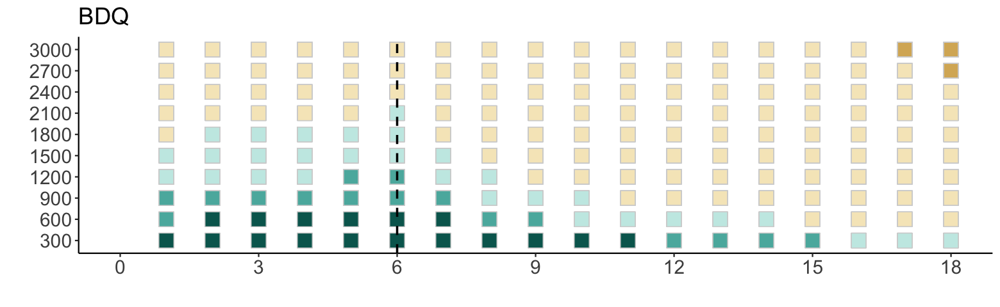

In [136]:
options(repr.plot.width = 13, repr.plot.height = 4)

# original
cas10<-ivt_df[(ivt_df$METAB==cmpd)&(ivt_df$TARGET=='casMBC10'),]$value_mgL
if (cas10 > p_lloq) {
  my_colors <- my_colors_lloq_lowest
} else {
  my_colors <- my_colors_cas10_lowest
}

# delete below once MIC logic added #
mic_grab <- mic_dict[(mic_dict$METAB==cmpd)&(mic_dict$TARGET=='MIC'),]$value_mgL
if (cas10 > mic_grab) {
  my_colors <- mic_colors_w_loq_lowest
} else {
  my_colors <- mic_colors_w_cas10_lowest
}
#my_colors <- my_colors_w_mic
# delete above once MIC logic added #

bdq_tile<-ggplot(subset(flt_gath4,METAB==cmpd&DIST<=3000&TIME_MONTHS%%1 == 0), 
          mapping=aes(x=TIME_MONTHS, y=factor(DIST), 
                      #color=interaction(aboveMIC,TARGET_NAME)))+ 
                      fill=factor(interaction(aboveMIC,TARGET_NAME))))+
  geom_point(shape = 22, size = 7,color="lightgrey")+
  scale_x_continuous(breaks=seq(0,18,3), limits=c(0,18))+
  #scale_y_continuous(breaks=seq(0,3000,600), limits=c(0,3000))+
  theme_bw(base_size=14)+
  theme_classic(base_size=14)+
#  ylab("Distance from\nlesion border (um)")+
#  xlab("Time (months)")+
  ylab("")+
  xlab("")+
  labs(title=cmpd)+
  geom_vline(xintercept = 6, linetype="dashed", color="black", size=1)+
  scale_fill_manual(values=my_colors) +
  theme(strip.background = element_rect("transparent"),
        legend.direction = "vertical",
        legend.position = "none",
        axis.text = element_text(size=18),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18),
        #legend.position = "bottom",
        axis.title = element_text(size=18),
        legend.title=element_text(size=18),
        plot.title=element_text(size=22))+
guides(fill=guide_legend(title="Concentration above:"))
  #theme(legend.title=element_blank())
bdq_tile

In [137]:
#metabolite
cmpd <- "BDQ-M2"
flt_gath5 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <=max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC90")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC90")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC90")

flt_gath6 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == "BDQ-M2", 
                         ivt[(ivt$TARGET=="casMBC50")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC50")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC50")

flt_gath7 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC10")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC10")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC10")

flt_gath_m_lloq <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, m_lloq, m_lloq),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         #aboveMIC = ifelse((DV >= TARGET)&
         #                  (DV<ivt_bdq[(ivt_bdq$TARGET=="casMBC10")&
         #                              (ivt_bdq$METAB=="BDQ-M2"),]$value_mgL), 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "LLOQ")

#new
flt_gath_m_mic <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         mic[(mic$TARGET=="MIC")&(mic$METAB==cmpd),]$value_mgL, 
                         mic[(mic$TARGET=="MIC")&(mic$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "MIC")

flt_gath8 <- rbind(flt_gath_m_lloq, flt_gath_m_mic, flt_gath7, flt_gath6, flt_gath5) %>% 
  filter(TIME!=0)

Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”


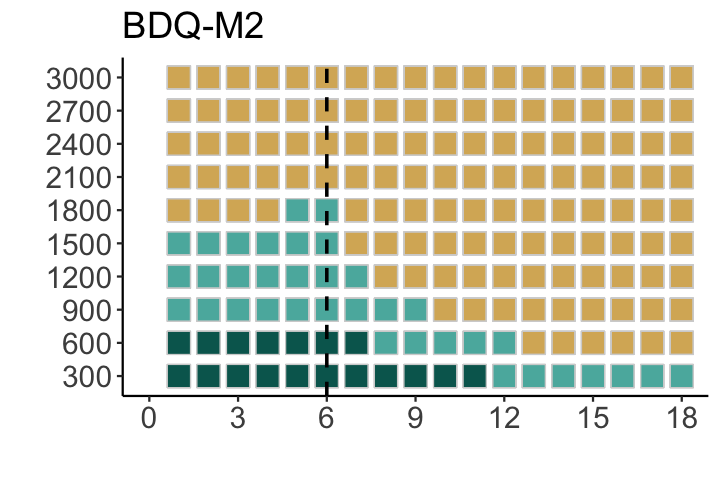

In [138]:
cas10<-ivt_df[(ivt_df$METAB==cmpd)&(ivt$TARGET=='casMBC10'),]$value_mgL
if (cas10 > m_lloq) {
  my_colors <- my_colors_lloq_lowest
} else {
  my_colors <- my_colors_cas10_lowest
}

# delete below once MIC logic added #
mic_grab <- mic_dict[(mic_dict$METAB==cmpd)&(mic_dict$TARGET=='MIC'),]$value_mgL
if (cas10 > mic_grab) {
  my_colors <- mic_colors_w_loq_lowest
} else {
  my_colors <- mic_colors_w_cas10_lowest
}
#my_colors <- my_colors_w_mic
# delete above once MIC logic added #

options(repr.plot.width = 6, repr.plot.height = 4)
bdqm2_tile<-ggplot(subset(flt_gath8,METAB==cmpd&DIST<=3000&TIME_MONTHS%%1 == 0), 
                   mapping=aes(x=TIME_MONTHS, y=factor(DIST), 
                               #color=interaction(aboveMIC,TARGET_NAME), 
                               fill=factor(interaction(aboveMIC,TARGET_NAME))))+
  geom_point(shape = 22, size = 7,color="lightgrey")+
  scale_x_continuous(breaks=seq(0,18,3), limits=c(0,18))+
  theme_bw(base_size=14)+
  theme_classic(base_size=14)+
  #ylab("Distance from\nlesion border (um)")+
  #xlab("Time (months)")+
  ylab("")+
  xlab("")+
  labs(title=cmpd)+
  geom_vline(xintercept = 6, linetype="dashed", color="black", size=1)+
  scale_fill_manual(values=my_colors) + 
  theme(strip.background = element_rect("transparent"),
        legend.direction = "vertical",
        legend.position = "none",
        axis.text = element_text(size=18),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18),
        axis.title = element_text(size=18),
        legend.title=element_text(size=18),
        plot.title=element_text(size=22))+
guides(fill=guide_legend(title="Concentration above:"))
 # theme(legend.title=element_blank())
bdqm2_tile

Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”


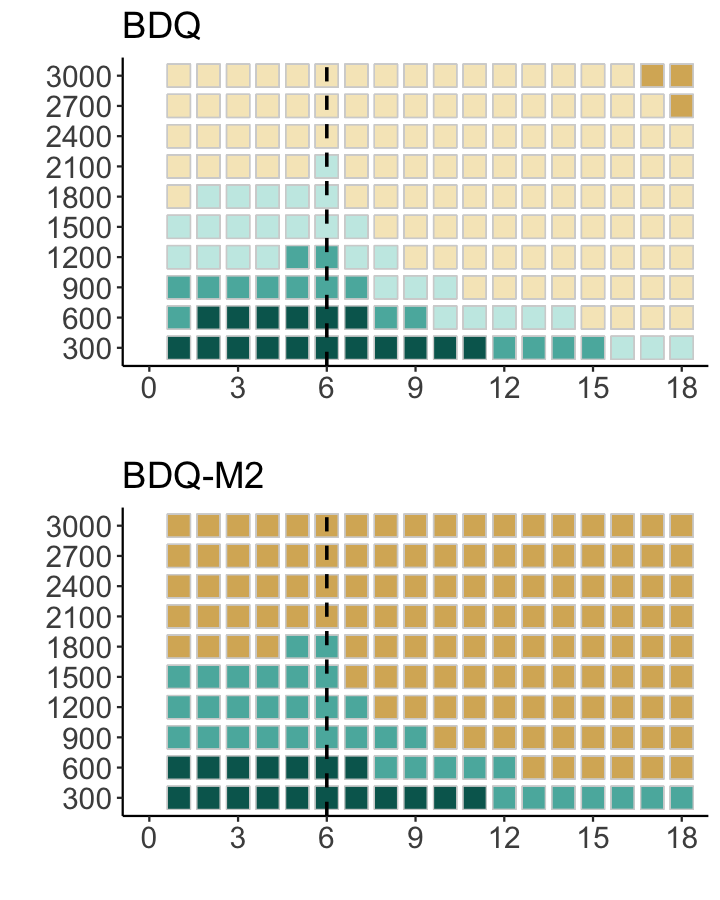

In [139]:
options(repr.plot.width = 6, repr.plot.height = 7.5)
plot_grid(bdq_tile, bdqm2_tile, ncol = 1,align="hv")

### TBAJ587

In [140]:
ivt <- ivt_df %>% 
      filter((METAB == "TBAJ-587")|(METAB=='TBAJ-587-M3'))

mic <- mic_dict %>% 
      filter((METAB == "TBAJ-587")|(METAB=='TBAJ-587-M3'))

In [141]:
x <- read_nm_tables((paste(clin_587_dir, '/sdtabS587_04',sep=''))) %>% 
  filter(EVID ==0)

SIM_1_to_plot <- x %>% 
  select(ID, TIME, DIST, CPP, CPM, AA10, AA11) %>%
  rename(TBAJ587_plasma = CPP,
         M3_plasma = CPM,
         TBAJ587_caseum = AA10,
         M3_caseum = AA11) %>% 
  gather(key = "CMT", value = mg.L, 4:7) %>% 
  mutate(DV  = exp(mg.L)) %>% 
  mutate(METAB = ifelse(grepl("M3",CMT),"TBAJ-587-M3","TBAJ-587"),
         LESION = ifelse(grepl("plasma",CMT),"Plasma","Caseum"))

SIM_1_to_plot$TIME_MONTHS <- SIM_1_to_plot$TIME/24/7/4


Looking for nonmem output tables.

Reading: sdtabS587_04 [$prob no.1]

Warning message:
“There was 1 warning in `dplyr::mutate()`.
ℹ In argument: `table = purrr::map2(.x = .$fun, .y = .$params, .f = do.call)`.
Caused by warning:
! Duplicated column names deduplicated: 'DV' => 'DV_1' [16]”


In [142]:
#parent
cmpd <- "TBAJ-587"
flt_gath1 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <=max(DIST)) %>% 
         mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC90")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC90")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC90")

flt_gath2 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
         mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC50")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC50")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         #aboveMIC = ifelse((DV >= TARGET)&
         #                  (DV<ivt[(ivt$TARGET=="casMBC90")&(ivt$METAB==cmpd),]$value_mgL), 
         #                   1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC50")

flt_gath3 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
         mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC10")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC10")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         #aboveMIC = ifelse((DV >= TARGET)&
         #                  (DV<ivt[(ivt$TARGET=="casMB50")&(ivt$METAB==cmpd),]$value_mgL), 
         #                   1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC10")

flt_gath_p_lloq <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
         mutate(TARGET = ifelse(METAB == "BDQ", p_lloq, p_lloq),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         #aboveMIC = ifelse((DV >= TARGET)&
         #                  (DV<ivt[(ivt$TARGET=="casMB10")&(ivt$METAB==cmpd),]$value_mgL), 
         #                   1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "LLOQ")

#new
flt_gath_p_mic <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         mic[(mic$TARGET=="MIC")&(mic$METAB==cmpd),]$value_mgL, 
                         mic[(mic$TARGET=="MIC")&(mic$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "MIC")

flt_gath4 <- rbind(flt_gath_p_lloq, flt_gath_p_mic, flt_gath3, flt_gath2, flt_gath1)

Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”


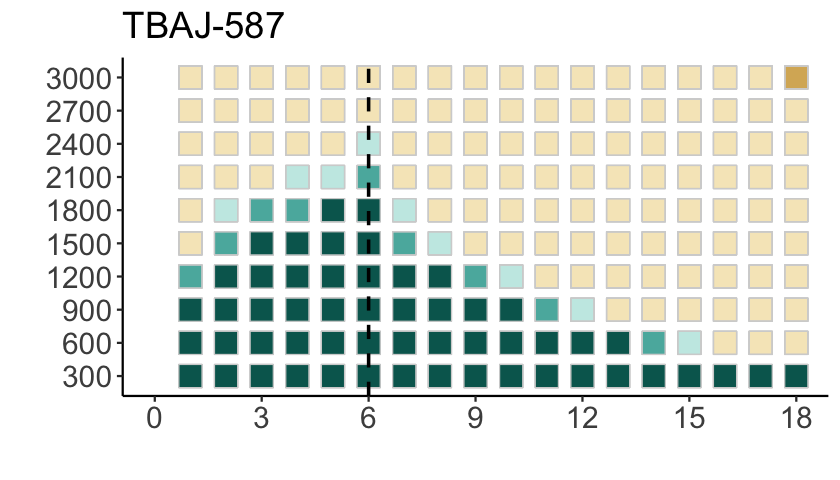

In [143]:
options(repr.plot.width = 7, repr.plot.height = 4)

cas10<-ivt_df[(ivt_df$METAB==cmpd)&(ivt_df$TARGET=='casMBC10'),]$value_mgL
if (cas10 > p_lloq) {
  my_colors <- my_colors_lloq_lowest
} else {
  my_colors <- my_colors_cas10_lowest
}

# delete below once MIC logic added #
mic_grab <- mic_dict[(mic_dict$METAB==cmpd)&(mic_dict$TARGET=='MIC'),]$value_mgL
if (cas10 > mic_grab) {
  my_colors <- mic_colors_w_loq_lowest
} else {
  my_colors <- mic_colors_w_cas10_lowest
}
#my_colors <- my_colors_w_mic
# delete above once MIC logic added #

s587_tile<-ggplot(subset(flt_gath4,METAB==cmpd&DIST<=3000&TIME_MONTHS%%1 == 0), 
                   mapping=aes(x=TIME_MONTHS, y=factor(DIST), 
                               #color=interaction(aboveMIC,TARGET_NAME), 
                               fill=factor(interaction(aboveMIC,TARGET_NAME))))+
  geom_point(shape = 22, size = 7,color="lightgrey")+
  scale_x_continuous(breaks=seq(0,18,3), limits=c(0,18))+
  theme_bw(base_size=14)+
  theme_classic(base_size=14)+
  #ylab("Distance from\nlesion border (um)")+
  #xlab("Time (months)")+
  ylab("")+
  xlab("")+
  labs(title=cmpd)+
  geom_vline(xintercept = 6, linetype="dashed", color="black", size=1)+
  scale_fill_manual(values=my_colors) + 
  theme(strip.background = element_rect("transparent"),
        legend.direction = "vertical",
        legend.position = "none",
        axis.text = element_text(size=18),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18),
        axis.title = element_text(size=18),
        legend.title=element_text(size=18),
        plot.title=element_text(size=22))+
guides(fill=guide_legend(title="Concentration above:"))
 # theme(legend.title=element_blank())
  #theme(legend.title=element_blank())
s587_tile

In [144]:
#metabolite
cmpd <- "TBAJ-587-M3"
flt_gath5 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <=max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC90")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC90")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC90")

flt_gath6 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC50")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC50")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC50")

flt_gath7 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC10")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC10")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC10")

flt_gath_m_lloq <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, m_lloq, m_lloq),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         #aboveMIC = ifelse((DV >= TARGET)&
         #                  (DV<ivt_bdq[(ivt_bdq$TARGET=="casMBC10")&
         #                              (ivt_bdq$METAB=="BDQ-M2"),]$value_mgL), 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "LLOQ")

#new
flt_gath_m_mic <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         mic[(mic$TARGET=="MIC")&(mic$METAB==cmpd),]$value_mgL, 
                         mic[(mic$TARGET=="MIC")&(mic$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "MIC")

flt_gath8 <- rbind(flt_gath_m_lloq, flt_gath_m_mic, flt_gath7, flt_gath6, flt_gath5)

Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”


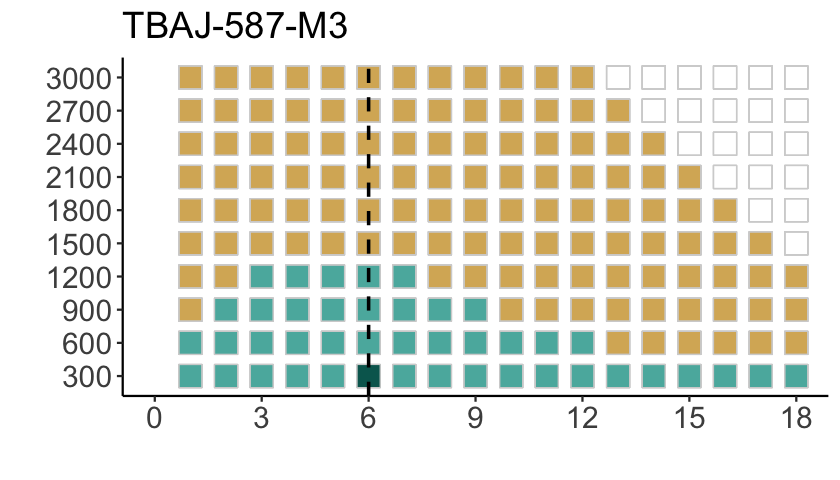

In [145]:

cas10<-ivt[(ivt$METAB==cmpd)&(ivt$TARGET=='casMBC10'),]$value_mgL
if (cas10 > m_lloq) {
  my_colors <- my_colors_lloq_lowest
} else {
  my_colors <- my_colors_cas10_lowest
}

# delete below once MIC logic added #
mic_grab <- mic_dict[(mic_dict$METAB==cmpd)&(mic_dict$TARGET=='MIC'),]$value_mgL
if (cas10 > mic_grab) {
  my_colors <- mic_colors_w_loq_lowest
} else {
  my_colors <- mic_colors_w_cas10_lowest
}
#my_colors <- my_colors_w_mic
# delete above once MIC logic added #

s587m3_tile<-ggplot(subset(flt_gath8,METAB==cmpd&DIST<=3000&TIME_MONTHS%%1 == 0), 
                   mapping=aes(x=TIME_MONTHS, y=factor(DIST), 
                               #color=interaction(aboveMIC,TARGET_NAME), 
                               fill=factor(interaction(aboveMIC,TARGET_NAME))))+
  geom_point(shape = 22, size = 7,color="lightgrey")+
  scale_x_continuous(breaks=seq(0,18,3), limits=c(0,18))+
  theme_bw(base_size=14)+
  theme_classic(base_size=14)+
  #ylab("Distance from\nlesion border (um)")+
  #xlab("Time (months)")+
  ylab("")+
  xlab("")+
  labs(title=cmpd)+
  geom_vline(xintercept = 6, linetype="dashed", color="black", size=1)+
  scale_fill_manual(values=my_colors) + 
  theme(strip.background = element_rect("transparent"),
        legend.direction = "vertical",
        legend.position = "none",
        axis.text = element_text(size=18),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18),
        axis.title = element_text(size=18),
        legend.title=element_text(size=18),
        plot.title=element_text(size=22))+
guides(fill=guide_legend(title="Concentration above:"))
s587m3_tile

Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”


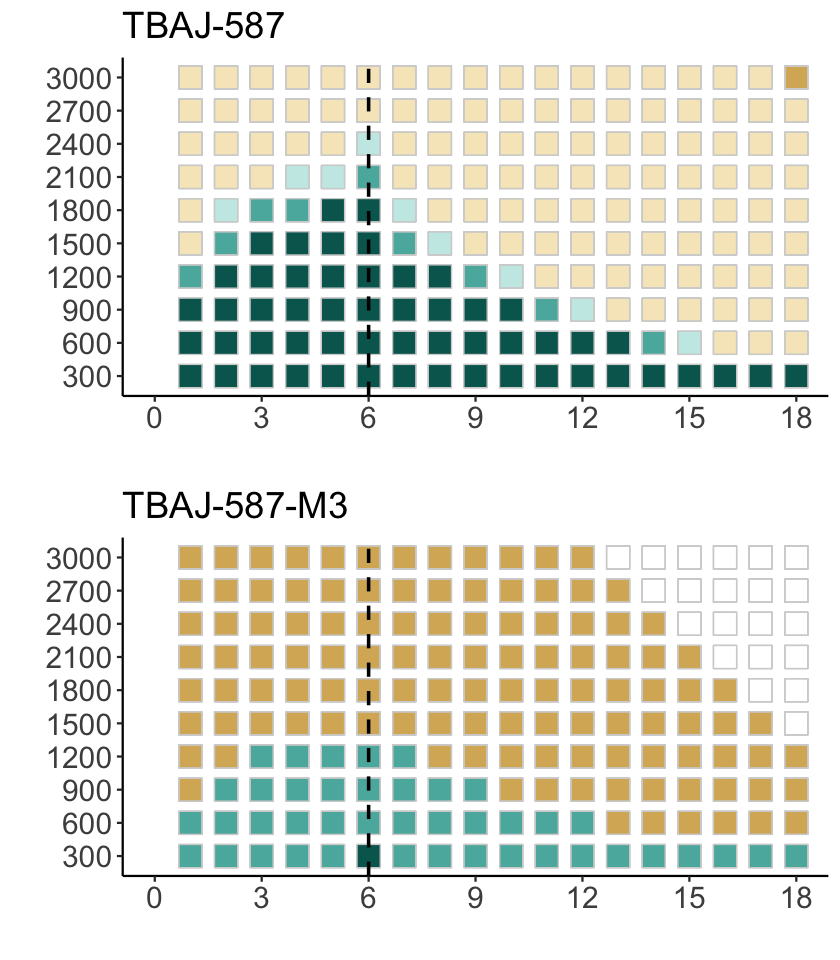

In [146]:
options(repr.plot.width = 7, repr.plot.height = 8)
plot_grid(s587_tile, s587m3_tile, ncol = 1,align="hv")

### TBAJ876

In [147]:
ivt <- ivt_df %>% 
      filter((METAB == "TBAJ-876")|(METAB=='TBAJ-876-M3'))

mic <- mic_dict %>% 
      filter((METAB == "TBAJ-876")|(METAB=='TBAJ-876-M3'))

In [148]:
x <- read_nm_tables((paste(clin_876_dir, '/',"sdtabS40",sep=''))) %>% 
  filter(EVID ==0)

SIM_1_to_plot <- x %>% 
  select(ID, TIME, DIST, CPP, CPM, AA11, AA12) %>%
  rename(TBAJ876_plasma = CPP,
         M3_plasma = CPM,
         TBAJ876_caseum = AA11,
         M3_caseum = AA12) %>% 
  gather(key = "CMT", value = "lnDV", 4:7) %>% 
  mutate(DV  = exp(lnDV)) %>% 
  mutate(METAB = ifelse(grepl("M3",CMT),"TBAJ-876-M3","TBAJ-876"),
         LESION = ifelse(grepl("plasma",CMT),"Plasma","Caseum"),
         TIME_MONTHS = TIME/24/7/4)


Looking for nonmem output tables.

Reading: sdtabS40 [$prob no.1]

Warning message:
“There was 1 warning in `dplyr::mutate()`.
ℹ In argument: `table = purrr::map2(.x = .$fun, .y = .$params, .f = do.call)`.
Caused by warning:
! Duplicated column names deduplicated: 'DV' => 'DV_1' [12]”


In [149]:
#parent
cmpd <- "TBAJ-876"
flt_gath1 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <=max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC90")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC90")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC90")

flt_gath2 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC50")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC50")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC50")

flt_gath3 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC10")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC10")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC10")

flt_gath_p_lloq <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == "BDQ", p_lloq, p_lloq),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         #aboveMIC = ifelse((DV >= TARGET)#&
                           #(DV<ivt_bdq[(ivt_bdq$TARGET=="casMBC10")&
                           #            (ivt_bdq$METAB=="BDQ"),]$value_mgL), 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "LLOQ")

#new
flt_gath_p_mic <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         mic[(mic$TARGET=="MIC")&(mic$METAB==cmpd),]$value_mgL, 
                         mic[(mic$TARGET=="MIC")&(mic$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "MIC")

flt_gath4 <- rbind(flt_gath_p_lloq, flt_gath_p_mic, flt_gath3, flt_gath2, flt_gath1)

Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”


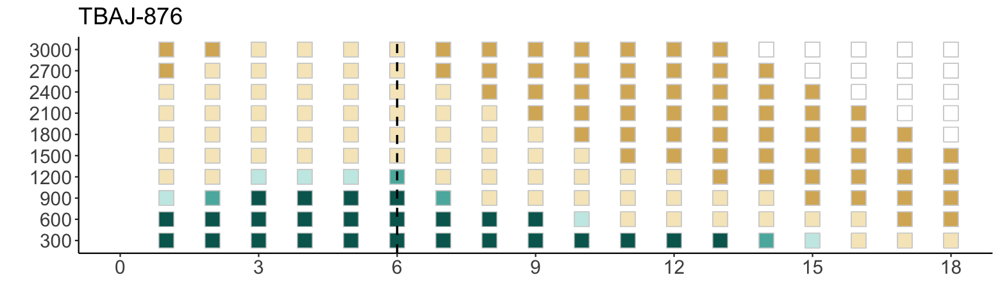

In [150]:
# less depth, more time CASMBC10
options(repr.plot.width = 13, repr.plot.height = 4)

cas10<-ivt_df[(ivt_df$METAB==cmpd)&(ivt_df$TARGET=='casMBC10'),]$value_mgL
if (cas10 > p_lloq) {
  my_colors <- my_colors_lloq_lowest
} else {
  my_colors <- my_colors_cas10_lowest
}

# delete below once MIC logic added #
mic_grab <- mic_dict[(mic_dict$METAB==cmpd)&(mic_dict$TARGET=='MIC'),]$value_mgL
if (cas10 > mic_grab) {
  my_colors <- mic_colors_w_loq_lowest
} else {
  my_colors <- mic_colors_w_cas10_lowest
}
#my_colors <- my_colors_w_mic
# delete above once MIC logic added #

s876_tile<-ggplot(subset(flt_gath4,METAB==cmpd&DIST<=3000&TIME_MONTHS%%1 == 0), 
                   mapping=aes(x=TIME_MONTHS, y=factor(DIST), 
                               #color=interaction(aboveMIC,TARGET_NAME), 
                               fill=factor(interaction(aboveMIC,TARGET_NAME))))+
  geom_point(shape = 22, size = 7,color="lightgrey")+
  scale_x_continuous(breaks=seq(0,18,3), limits=c(0,18))+
  theme_bw(base_size=14)+
  theme_classic(base_size=14)+
  #ylab("Distance from\nlesion border (um)")+
  #xlab("Time (months)")+
  ylab("")+
  xlab("")+
  labs(title=cmpd)+
  geom_vline(xintercept = 6, linetype="dashed", color="black", size=1)+
  scale_fill_manual(values=my_colors) + 
  theme(strip.background = element_rect("transparent"),
        legend.direction = "vertical",
        legend.position = "none",
        axis.text = element_text(size=18),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18),
        axis.title = element_text(size=18),
        legend.title=element_text(size=18),
        plot.title=element_text(size=22))+
guides(fill=guide_legend(title="Concentration above:"))
s876_tile

In [151]:
#metabolite
cmpd <- "TBAJ-876-M3"
flt_gath5 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <=max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC90")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC90")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC90")

flt_gath6 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC50")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC50")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC50")

flt_gath7 <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         ivt[(ivt$TARGET=="casMBC10")&(ivt$METAB==cmpd),]$value_mgL, 
                         ivt[(ivt$TARGET=="casMBC10")&(ivt$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "casMBC10")

flt_gath_m_lloq <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, m_lloq, m_lloq),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         #aboveMIC = ifelse((DV >= TARGET)&
         #                  (DV<ivt_bdq[(ivt_bdq$TARGET=="casMBC10")&
         #                              (ivt_bdq$METAB=="BDQ-M2"),]$value_mgL), 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "LLOQ")

#new
flt_gath_m_mic <- SIM_1_to_plot %>% 
  filter(TIME %% (24*7) == 0,
         grepl(pattern =  "aseum",CMT),
         DIST <= max(DIST)) %>% 
  mutate(TARGET = ifelse(METAB == cmpd, 
                         mic[(mic$TARGET=="MIC")&(mic$METAB==cmpd),]$value_mgL, 
                         mic[(mic$TARGET=="MIC")&(mic$METAB==cmpd),]$value_mgL),
         aboveMIC = ifelse(DV >= TARGET, 1 ,0),
         TIME_MONTHS = TIME/24/7/4, # divide hours by 24 h by 7 days by 4 weeks per month
         TARGET_NAME = "MIC")

flt_gath8 <- rbind(flt_gath_m_lloq, flt_gath_m_mic, flt_gath7, flt_gath6, flt_gath5)

Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”


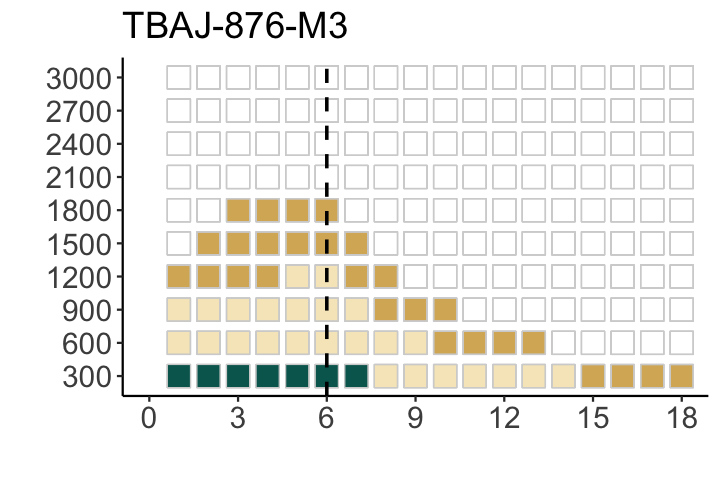

In [153]:
# less depth, more time
cas10<-ivt[(ivt$METAB==cmpd)&(ivt$TARGET=='casMBC10'),]$value_mgL
if (cas10 > m_lloq) {
  my_colors <- my_colors_lloq_lowest
} else {
  my_colors <- my_colors_cas10_lowest
}

# delete below once MIC logic added #
mic_grab <- mic_dict[(mic_dict$METAB==cmpd)&(mic_dict$TARGET=='MIC'),]$value_mgL
if (cas10 > mic_grab) {
  my_colors <- mic_colors_w_loq_lowest
} else {
  my_colors <- mic_colors_w_cas10_lowest
}
#my_colors <- my_colors_w_mic
# delete above once MIC logic added #

options(repr.plot.width = 6, repr.plot.height = 4)
s876m3_tile<-ggplot(subset(flt_gath8,METAB==cmpd&DIST<=3000&TIME_MONTHS%%1 == 0), 
                   mapping=aes(x=TIME_MONTHS, y=factor(DIST), 
                               #color=interaction(aboveMIC,TARGET_NAME), 
                               fill=factor(interaction(aboveMIC,TARGET_NAME))))+
  geom_point(shape = 22, size = 7,color="lightgrey")+
  scale_x_continuous(breaks=seq(0,18,3), limits=c(0,18))+
  theme_bw(base_size=14)+
  theme_classic(base_size=14)+
  #ylab("Distance from\nlesion border (um)")+
  #xlab("Time (months)")+
  ylab("")+
  xlab("")+
  labs(title=cmpd)+
  geom_vline(xintercept = 6, linetype="dashed", color="black", size=1)+
  scale_fill_manual(values=my_colors) + 
  theme(strip.background = element_rect("transparent"),
        legend.direction = "vertical",
        legend.position = "none",
        axis.text = element_text(size=18),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18),
        axis.title = element_text(size=18),
        legend.title=element_text(size=18),
        plot.title=element_text(size=22))+
guides(fill=guide_legend(title="Concentration above:"))
s876m3_tile

### ALL DARQS PLOT

Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 3300 rows containing missing values (`geom_point()`).”


TableGrob (1 x 1) "arrange": 1 grobs
  z     cells    name            grob
1 1 (1-1,1-1) arrange gtable[arrange]

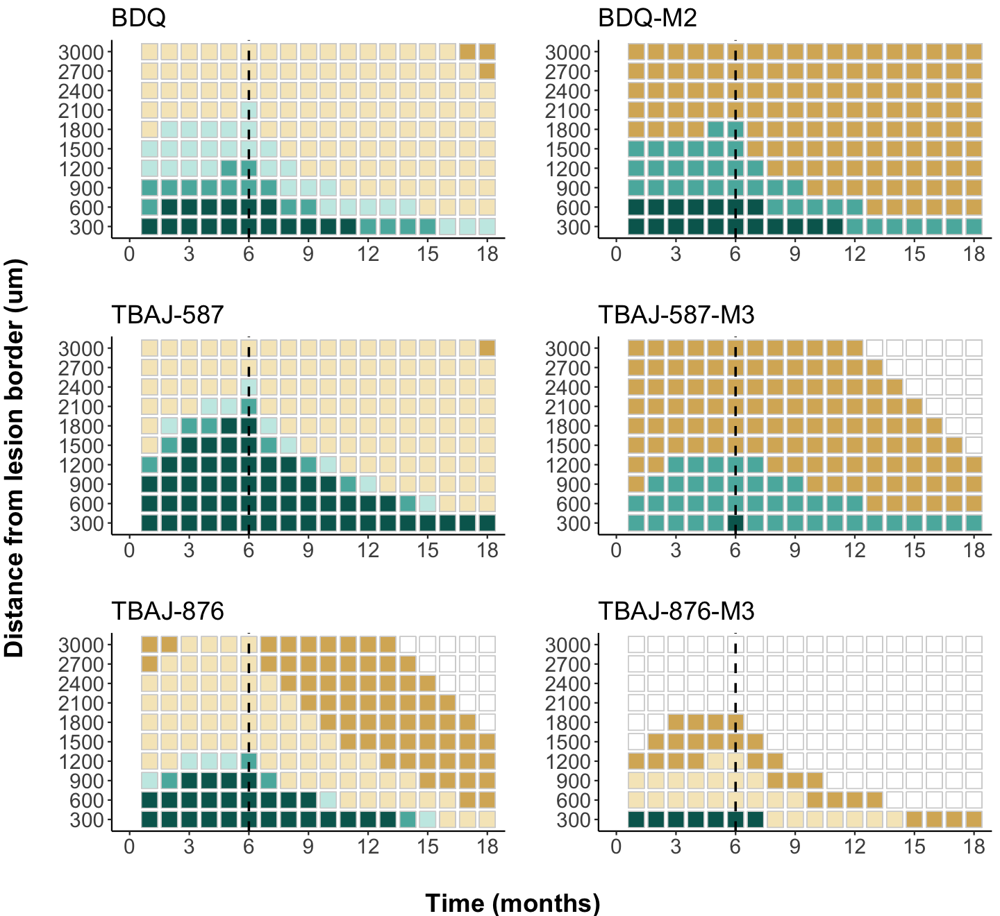

In [154]:
options(repr.plot.width = 12, repr.plot.height = 11)

tile_plot <- plot_grid(bdq_tile, bdqm2_tile, 
                       s587_tile, s587m3_tile, 
                       s876_tile, s876m3_tile, 
                       nrow = 3,align="hv")

y.grob <- textGrob("Distance from lesion border (um)", 
                   gp=gpar(fontface="bold",fontsize=22), rot=90)
x.grob <- textGrob("Time (months)", 
                   gp=gpar(fontface="bold",fontsize=22))

fig3c <- grid.arrange(arrangeGrob(tile_plot, left = y.grob, bottom = x.grob))
fig3c

## different scenarios

In [155]:
distances <- as_labeller(c(
  `300`="300 um",
  `900`="900 um",
  `2700`="2700 um"
))

In [156]:
month_labs <- as_labeller(c(
  `2`="2 months QD",
  `3`="3 months QD",
  `4`="4 months QD",
  `5`="5 months QD"
))

In [157]:
month_labs_bdq <- as_labeller(c(
  #`2`="2 months",
  #`3`="3 months",
  `4`="4 months",
  `5`="5 months",
  `6`="6 months"
    
))

In [158]:
dose_labs <- as_labeller(c(
  #`2`="2 months",
  #`3`="3 months",
  `0`="QD",
  `1`="Loading dose"
    
))

### BDQ

In [159]:
ivt <- ivt_df

In [160]:
colfunc_bdq <- colorRampPalette(c('#54BA9A', '#327661'))

In [161]:
x <- read_nm_tables((paste(clin_bdq_dir, '/',"sdtabB06",sep=''))) %>% 
  filter(EVID ==0) %>% 
  filter(MONTHS != 5)#%>% 
  #filter(DOSE_TYPE == 'Loading')


Looking for nonmem output tables.

Reading: sdtabB06 [$prob no.1]



In [162]:
SIM_1_to_plot <- x %>% 
        select(ID, TIME, DIST, DOSE_TYPE, MONTHS, CPP, AA9) %>%
        rename(TBAJ876_plasma = CPP, TBAJ876_caseum = AA9) %>% 
        gather(key = "CMT", value = "lnDV", 6:7) %>% 
        mutate(DV  = exp(lnDV)) %>% 
        #filter(DOSE_TYPE==1) %>%
        mutate(LESION = ifelse(grepl("plasma",CMT),"Plasma","Caseum"))

SIM_1_to_plot$TIME_MONTHS <- SIM_1_to_plot$TIME/24/7/4
SIM_1_to_plot$overall <- 'BDQ'

SIM_1_to_plot_summ <- SIM_1_to_plot %>% 
        group_by(CMT,LESION,TIME_MONTHS,DIST,DOSE_TYPE,MONTHS) %>% 
        summarise(medDV = median(DV),
            loDV = quantile(DV,0.05),
            hiDV = quantile(DV,0.95))%>% 
        filter(LESION =="Caseum")

`summarise()` has grouped output by 'CMT', 'LESION', 'TIME_MONTHS', 'DIST', 'DOSE_TYPE'. You
can override using the `.groups` argument.


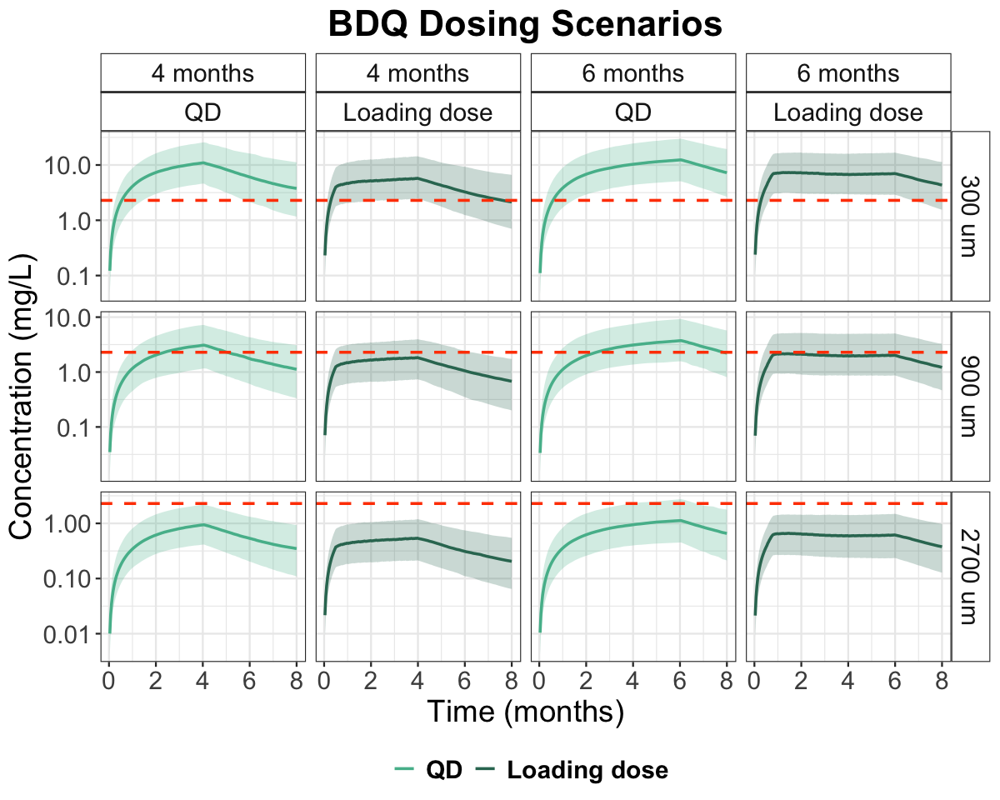

In [163]:
options(repr.plot.width = 10, repr.plot.height = 8)
    
bdq_dosing<-ggplot(SIM_1_to_plot_summ, mapping = aes(x = TIME_MONTHS, y = medDV, group = rev(DOSE_TYPE), 
                                             color=factor(DOSE_TYPE),fill=factor(DOSE_TYPE)))+
      geom_line(size=1)+
      geom_ribbon(aes(ymin=loDV,ymax=hiDV),color=NA, alpha=0.25)+
      facet_grid(DIST ~ MONTHS + DOSE_TYPE,labeller = labeller(DIST = distances,
                                                               MONTHS = month_labs_bdq, 
                                                               DOSE_TYPE=dose_labs), 
                 scales='free')+
      geom_hline(ivt[ivt$TARGET=='casMBC90'&ivt$METAB=='BDQ',],
                 mapping=aes(yintercept = value_mgL),linetype="dashed", size = 1, color = "orangered")+
      theme_bw(base_size=14)+
      scale_y_log10()+
      scale_color_manual(values=c(colfunc_bdq(2)[1],colfunc_bdq(2)[2]), 
                         labels = c("QD", "Loading dose"), 
                         name = "")+
      scale_fill_manual(values=c(colfunc_bdq(2)[1],colfunc_bdq(2)[2]),
                        labels = c("QD", "Loading dose"), 
                        name = "")+
      guides(fill="none")+
      ylab("Concentration (mg/L)")+
      xlab("Time (months)")+
      labs(title="BDQ Dosing Scenarios")+
      theme(
        strip.background = element_rect("transparent"),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18, face='bold'),
        legend.direction = "horizontal",
        axis.text = element_text(size=18),
        axis.title = element_text(size=22),
        plot.title=element_text(size=26, hjust = 0.5, face='bold'),
        strip.placement = "outside",
        legend.position = "bottom")
bdq_dosing

### TBAJ587

In [164]:
ivt <- ivt_df

In [165]:
colfunc_587 <- colorRampPalette(c('#FDC4AD', '#D54209'))

In [166]:
x <- read_nm_tables((paste(clin_587_dir, '/',"sdtabS587_06",sep=''))) %>% 
  filter(EVID ==0)


Looking for nonmem output tables.

Reading: sdtabS587_06 [$prob no.1]

Warning message:
“There was 1 warning in `dplyr::mutate()`.
ℹ In argument: `table = purrr::map2(.x = .$fun, .y = .$params, .f = do.call)`.
Caused by warning:
! Duplicated column names deduplicated: 'DV' => 'DV_1' [17]”


In [167]:
SIM_1_to_plot <- x %>% 
        select(ID, TIME, DIST, DOSE, MONTHS, CPP, AA10) %>%
        rename(TBAJ876_plasma = CPP, TBAJ876_caseum = AA10) %>% 
        gather(key = "CMT", value = "lnDV", 6:7) %>% 
        mutate(DV  = exp(lnDV)) %>% 
        mutate(LESION = ifelse(grepl("plasma",CMT),"Plasma","Caseum"))

SIM_1_to_plot$TIME_MONTHS <- SIM_1_to_plot$TIME/24/7/4
SIM_1_to_plot$overall <- 'TBAJ587'

SIM_1_to_plot_summ <- SIM_1_to_plot %>% 
        group_by(CMT,LESION,TIME_MONTHS,DIST,DOSE,MONTHS) %>% 
        summarise(medDV = median(DV),
            loDV = quantile(DV,0.05),
            hiDV = quantile(DV,0.95))%>% 
        filter(LESION =="Caseum")

`summarise()` has grouped output by 'CMT', 'LESION', 'TIME_MONTHS', 'DIST', 'DOSE'. You can
override using the `.groups` argument.


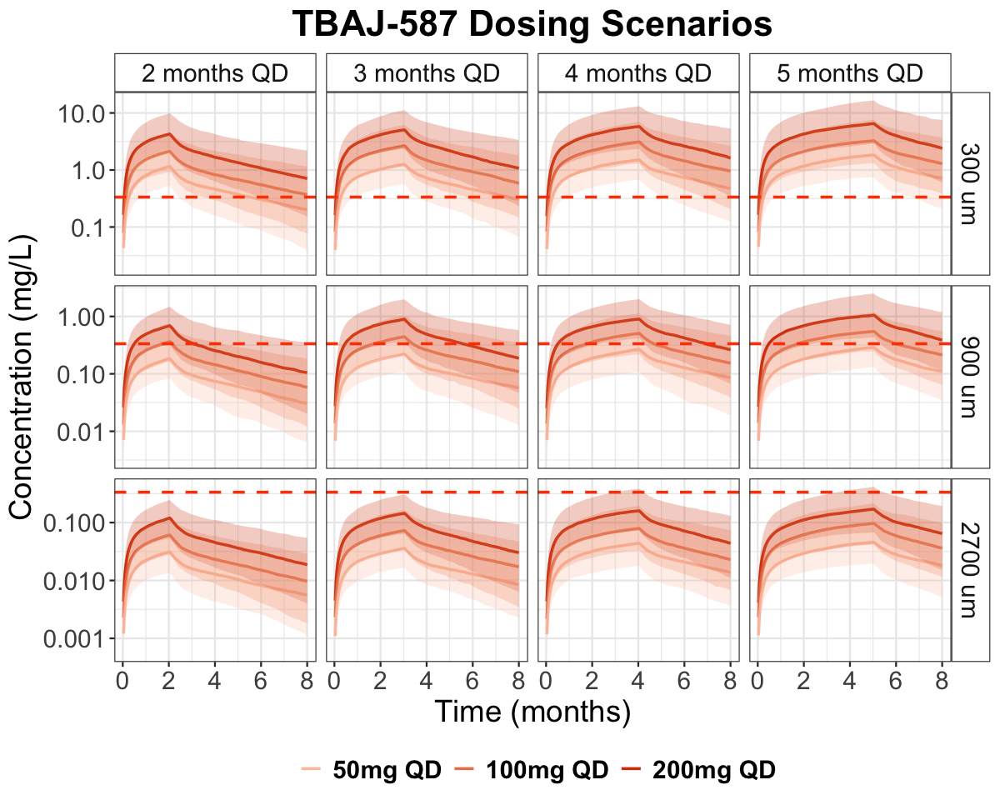

In [168]:
options(repr.plot.width = 10, repr.plot.height = 8)
    
s587_dosing<-ggplot(SIM_1_to_plot_summ, mapping = aes(x = TIME_MONTHS, y = medDV, group = rev(DOSE), 
                                             color=factor(DOSE),fill=factor(DOSE)))+
      geom_line(size=1)+
      geom_ribbon(aes(ymin=loDV,ymax=hiDV),color=NA, alpha=0.25)+
      facet_grid(DIST ~ MONTHS,labeller = labeller(DIST = distances,
                                                   MONTHS = month_labs), scales='free')+
      geom_hline(ivt[ivt$TARGET=='casMBC90'&ivt$METAB=='TBAJ-587',],
                 mapping=aes(yintercept = value_mgL),linetype="dashed", size = 1, color = "orangered")+
      theme_bw(base_size=14)+
      #scale_y_log10(limits=c(0.0005, 3))+
      scale_y_log10()+
      #scale_y_continuous(limits=c(0, 2.2))+
      scale_color_manual(values=c(colfunc_587(3)[1],colfunc_587(3)[2],colfunc_587(3)[3]), 
                         labels = c("50mg QD", "100mg QD", "200mg QD"), 
                         name = "")+
      scale_fill_manual(values=c(colfunc_587(3)[1],colfunc_587(3)[2],colfunc_587(3)[3]),
                        labels = c("50mg QD", "100mg QD", "200mg QD"),
                        name = "")+
      guides(fill="none")+
      ylab("Concentration (mg/L)")+
      xlab("Time (months)")+
      labs(title="TBAJ-587 Dosing Scenarios")+
      theme(
        strip.background = element_rect("transparent"),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18, face='bold'),
        legend.direction = "horizontal",
        axis.text = element_text(size=18),
        axis.title = element_text(size=22),
        plot.title=element_text(size=26, hjust = 0.5, face='bold'),
        strip.placement = "outside",
        legend.position = "bottom")

s587_dosing

### TBAJ876

In [169]:
ivt <- ivt_df

In [170]:
colfunc_876 <- colorRampPalette(c('#FFD92F', '#9C841C'))

In [171]:
x <- read_nm_tables((paste(clin_876_dir, '/',"sdtabS43",sep=''))) %>% 
  filter(EVID ==0)


Looking for nonmem output tables.

Reading: sdtabS43 [$prob no.1]

Warning message:
“There was 1 warning in `dplyr::mutate()`.
ℹ In argument: `table = purrr::map2(.x = .$fun, .y = .$params, .f = do.call)`.
Caused by warning:
! Duplicated column names deduplicated: 'DV' => 'DV_1' [13]”


In [172]:
SIM_1_to_plot <- x %>% 
        select(ID, TIME, DIST, DOSE, MONTHS, CPP, AA11) %>%
        rename(TBAJ876_plasma = CPP, TBAJ876_caseum = AA11) %>% 
        gather(key = "CMT", value = "lnDV", 6:7) %>% 
        mutate(DV  = exp(lnDV)) %>% 
        mutate(LESION = ifelse(grepl("plasma",CMT),"Plasma","Caseum"))

SIM_1_to_plot$TIME_MONTHS <- SIM_1_to_plot$TIME/24/7/4
SIM_1_to_plot$overall <- 'TBAJ876'

SIM_1_to_plot_summ <- SIM_1_to_plot %>% 
        group_by(CMT,LESION,TIME_MONTHS,DIST,DOSE,MONTHS) %>% 
        summarise(medDV = median(DV),
            loDV = quantile(DV,0.05),
            hiDV = quantile(DV,0.95))%>% 
        filter(LESION =="Caseum")

`summarise()` has grouped output by 'CMT', 'LESION', 'TIME_MONTHS', 'DIST', 'DOSE'. You can
override using the `.groups` argument.


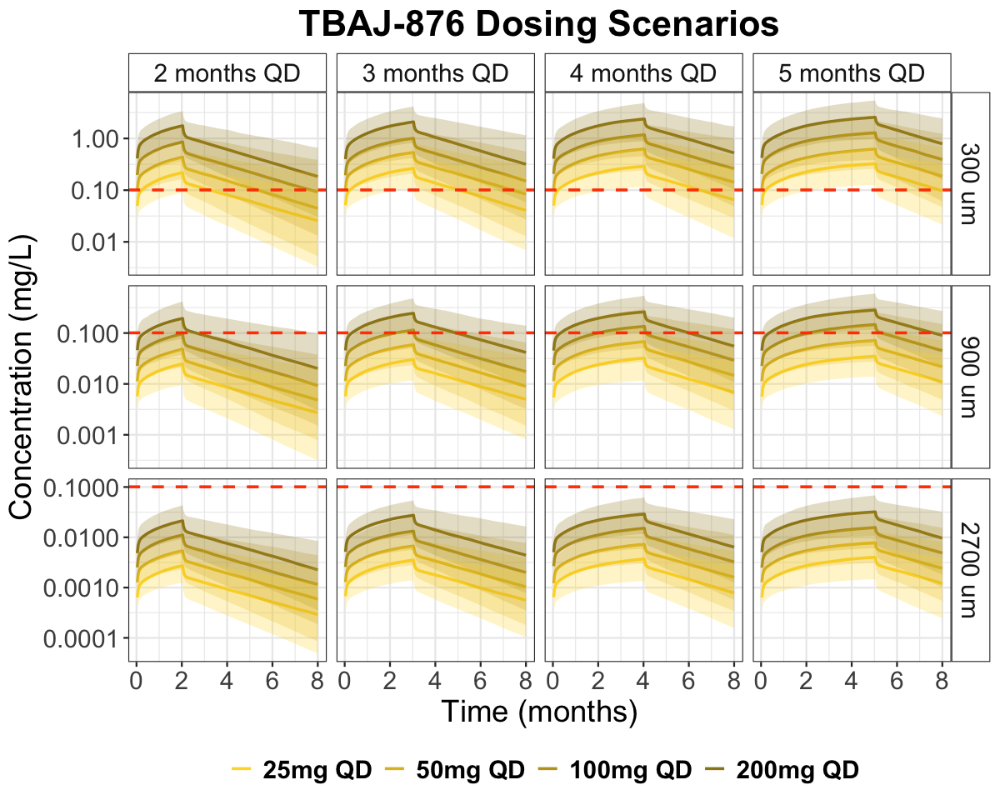

In [173]:
options(repr.plot.width = 10, repr.plot.height = 8)
    
s876_dosing<-ggplot(SIM_1_to_plot_summ, mapping = aes(x = TIME_MONTHS, y = medDV, group = rev(DOSE), 
                                             color=factor(DOSE),fill=factor(DOSE)))+
      geom_line(size=1)+
      geom_ribbon(aes(ymin=loDV,ymax=hiDV),color=NA, alpha=0.25)+
      facet_grid(DIST ~ MONTHS,labeller = labeller(DIST = distances,
                                                   MONTHS = month_labs), scales='free')+
      geom_hline(ivt[ivt$TARGET=='casMBC90'&ivt$METAB=='TBAJ-876',],
                 mapping=aes(yintercept = value_mgL),linetype="dashed", size = 1, color = "orangered")+
      theme_bw(base_size=14)+
      scale_y_log10()+
      scale_color_manual(values=c(colfunc_876(4)[1],colfunc_876(4)[2],
                                  colfunc_876(4)[3],colfunc_876(4)[4]), 
                         labels = c("25mg QD", "50mg QD", "100mg QD", "200mg QD"), 
                         name = "")+
      scale_fill_manual(values=c(colfunc_876(4)[1],colfunc_876(4)[2],
                                 colfunc_876(4)[3],colfunc_876(4)[4]),
                        labels = c("25mg QD", "50mg QD", "100mg QD", "200mg QD"),
                        name = "")+
      guides(fill="none")+
      ylab("Concentration (mg/L)")+
      xlab("Time (months)")+
      labs(title="TBAJ-876 Dosing Scenarios")+
      theme(
        strip.background = element_rect("transparent"),
        strip.text = element_text(size=18),
        legend.text = element_text(size=18, face='bold'),
        legend.direction = "horizontal",
        axis.text = element_text(size=18),
        axis.title = element_text(size=22),
        plot.title=element_text(size=26, hjust = 0.5, face='bold'),
        strip.placement = "outside",
        legend.position = "bottom")
s876_dosing

### ALL DARQS PLOT

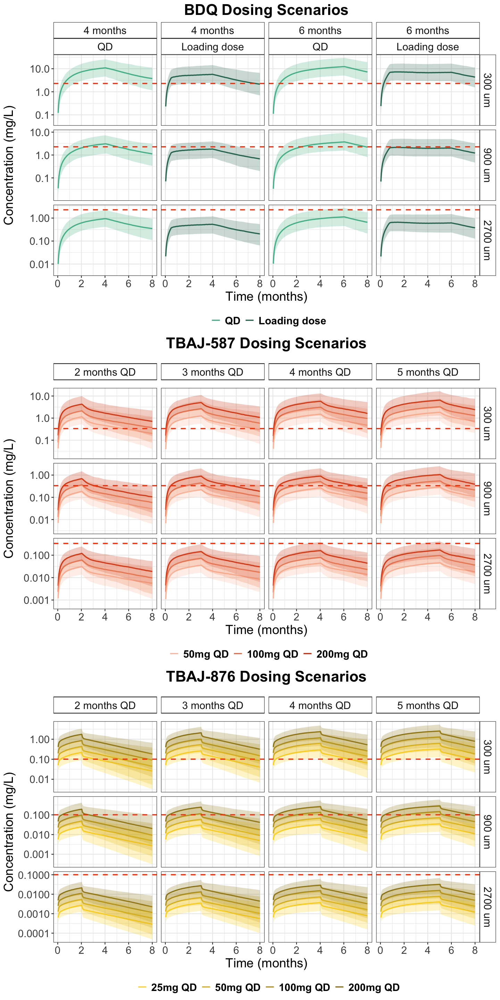

In [174]:
options(repr.plot.width = 12, repr.plot.height = 8*3)

dosing_plot <- plot_grid(bdq_dosing, 
                       s587_dosing, 
                       s876_dosing,  
                       nrow = 3,align="hv")
dosing_plot

#y.grob <- textGrob("Distance from lesion border (um)", 
#                   gp=gpar(fontface="bold",fontsize=22), rot=90)
#x.grob <- textGrob("Time (months)", 
#                   gp=gpar(fontface="bold",fontsize=22))

#fig3c <- grid.arrange(arrangeGrob(tile_plot, left = y.grob, bottom = x.grob))
#fig3c